# **Project 3**, APS1070 Fall 2023
#### **PCA [11 marks]**
**Deadline: Nov 17th, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

In this project we work on a [temperature dataset](https://berkeleyearth.org/data/) that reports the average earth surface temperature for different cities for each month over the years 1992-2006.

Please fill out the following:


*   **Name**: Declan Bracken
*   **Student number**: 1006251324



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858



# Part 1: Getting started with GitHub [1 Mark + 1 Mark Git Submission]

This first part of the project assignment is to be completed independently from Parts 2 - 5. In this part you will be completing some coding tasks and submitting your results on Github. To access this part of the assignment and upload your answers, you will need to use Github. Please complete the following step-by-step instructions:

 0. Create a Github account and install git for Windows or Mac:
  * https://git-scm.com/download/win
  * https://git-scm.com/download/mac

 1. Open this link: https://classroom.github.com/a/BWpQKQJt to create your assignment repository in GitHub. You should get a link similar to:
```
https://github.com/APS1070-UofT/project-3-part-1-Deklanor
```
This your private repository to get this part questions and upload your answers. **Copy this link to the text box below to be graded for this part.**


 2. Open `Git Bash`, the app you downloaded in step `0`, and set your Email and username by:
```
git config --global user.email “<declankbracken@gmail.com>”
git config --global user.name “<Deklanor>”
```

 3. Create a folder for the course on your computer and `cd` to that. `cd` means `Change Directory`. For example, on a Windows machine, where I have a folder on "C:\aps1070":
 ```
cd c:aps1070
```
 4. Get your assignment by the link you got in step 1:
```
git clone https://github.com/APS1070-UofT/project-3-part-1-*********
```

 5. A new folder should be created in your directory similar to:
```
C:\aps1070\project-3-part-1-********
```
This folder has an `ipynb` notebook which you need to manually upload to colab and answer its questions.

 6. After you finished working on this notebook, download the notebook from colab and move it to the directory in step 5.

 7. Replace the old notebook with the new one that has your answers. Make sure your completed notebook has the same name as the original notebook you downloaded.

 8. To submit your work, follow:
```
cd <your assignment folder>
git add F23_Project_3_Part_1_git.ipynb
git commit -m “Final Submission”
git push
```
If you have any problem with pushing your work on GitHub you can try one of following commands:
```
git push --force
or
git push origin HEAD:main
```

 9. Make sure your submission is ready for grading. Open the private repository link in your browser and make sure you can see your final submission with your latest changes there. **Only you and the teaching team can open that link.**

# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (180, 180).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`. **[0.25]**
4. How many PCs do you need to cover 99% of the dataset's variance? **[0.25]**
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first two PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

In [30]:
import pandas as pd
data_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/Sabaae/Dataset/main/TemperaturesbyCity.csv',
    index_col=0
)

In [31]:
### YOUR CODE HERE ###
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Standardize
dates = data_raw.columns
data_raw_std = StandardScaler().fit_transform(data_raw)
n, m = data_raw.shape

# Compute covariance matrix
covariance_mat = np.dot(data_raw_std.T, data_raw_std) / (n-1)

print("Covariance shape: ", covariance_mat.shape)

# Step 2: Create get_sorted_eigen
def get_sorted_eigen(df_cov):

  eigenvalues, eigenvectors = np.linalg.eigh(df_cov)
  #eigenvalues is M dimensional
  #eigevectors is MxM dimensional, with columns corresponding to the vectors

  #Flip array and matrix so that the first vector encompasses most variance:
  eigenvalues = np.flip(eigenvalues)
  eigenvectors = np.flip(eigenvectors, axis = 1)

  return eigenvalues, eigenvectors

eigenvalues, eigenvectors = get_sorted_eigen(covariance_mat)

Covariance shape:  (180, 180)


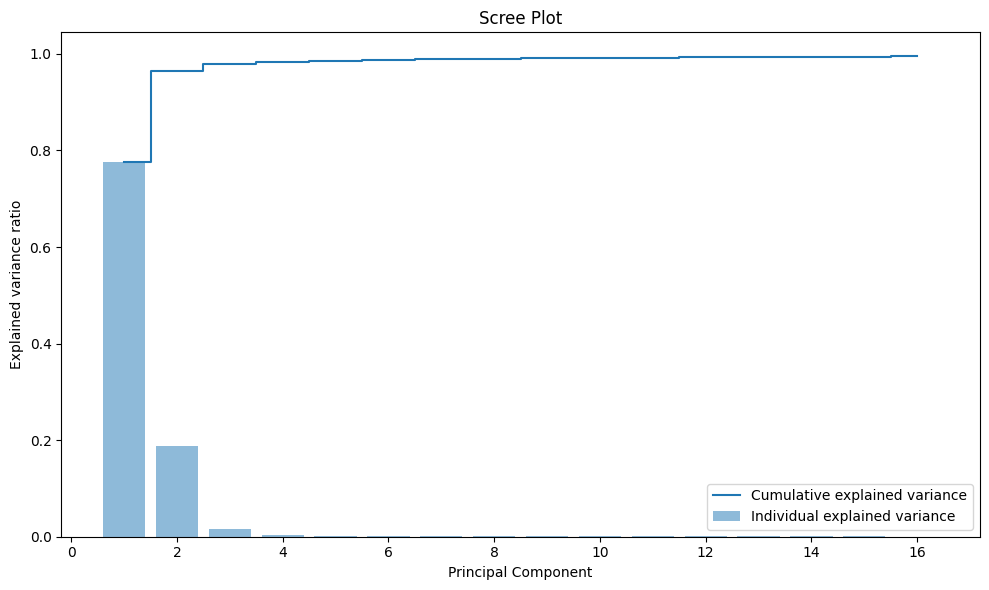

In [32]:
def scree_plot(eigenvalues, eigenvectors, num_components = 16):
  #get variance proportion per principal component
  explained_variances = eigenvalues/ np.sum(eigenvalues)

  # Get cumulative variance
  cum_variances = np.cumsum(explained_variances)

  # Figure
  plt.figure(figsize=(10, 6))
  plt.bar(range(1, num_components + 1), explained_variances[:num_components], alpha=0.5, align='center', label='Individual explained variance')
  plt.step(range(1, num_components + 1), cum_variances[:num_components], where='mid', label='Cumulative explained variance')

  plt.ylabel('Explained variance ratio')
  plt.xlabel('Principal Component')
  plt.title('Scree Plot')
  plt.legend(loc='best')
  plt.tight_layout()

  # Show plot
  plt.show()
  return cum_variances

cumulative_variance = scree_plot(eigenvalues, eigenvectors)

In [36]:
PC_above99 = np.where(cumulative_variance > 0.99)[0][0] + 1
print("Number of principal components required to explain 99% of variance: ", PC_above99)

Number of principal components required to explain 99% of variance:  9


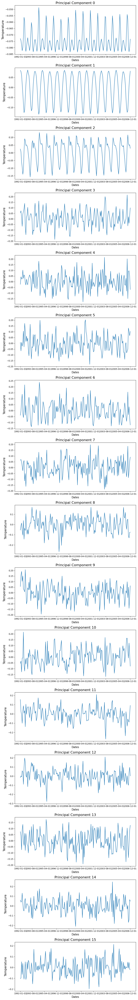

In [ ]:
def PC_subplots(eigenvalues, eigenvectors, num_components=16):
    fs = 16

    total_height = num_components * 4  # 4 inches per subplot
    fig = plt.figure(figsize=(9, total_height))

    # Calculate indices for 10 evenly spaced dates
    spaced_indices = np.linspace(0, len(dates) - 1, 10, dtype=int)
    spaced_dates = dates[spaced_indices]

    for i in range(num_components):
        ax = fig.add_subplot(num_components, 1, i + 1)
        ax.plot(dates, eigenvectors[:,i])
        ax.set_xlabel("Dates", fontsize=12)
        ax.set_ylabel("Temperature", fontsize=14)
        ax.set_title(f"Principal Component {i}", fontsize=16)

        # Set the custom x-ticks
        ax.set_xticks(spaced_dates)

    plt.tight_layout()
    plt.show()

PC_subplots(eigenvalues, eigenvectors, num_components=16)

The first 2 principal components are distinct from all other components in the form of their oscillation. The first principal component, which encompasses most of the variance of the entire dataset, is a sine wave where every other maximum is reduced amplitude, and with a frequency of 2 cycles per year. It's pattern is cyclic and predictable, with a period equal to the length of a calendar year. Similarily, the second principal component is a sinusoidal pattern, but with half the frequency of the first principal components, representing temperature distributions with only 1 maximum and 1 minimum per year. With just these 2 PC's the vast majority of dataset variance is explained, and anything beyond capturing the 3rd component can be seen to quickly devolve into unpredictable noise. This isn't to say that the remaining component's aren't useful for reconstruction, but their patterns are far less predictable or explainable than the primary components, especially the first 2 or 3.

# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a city and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues.
*   Plots 4 figures:
  1.   The original time-series for the specified city. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified city in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable):
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each month `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error.
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `Yakeshi`, `Zamboanga`, `Norilsk`, `Juliaca`, and `Doha` as inputs. **[0.5]**


Text(0, 0.5, 'Root Mean Squarred Error')

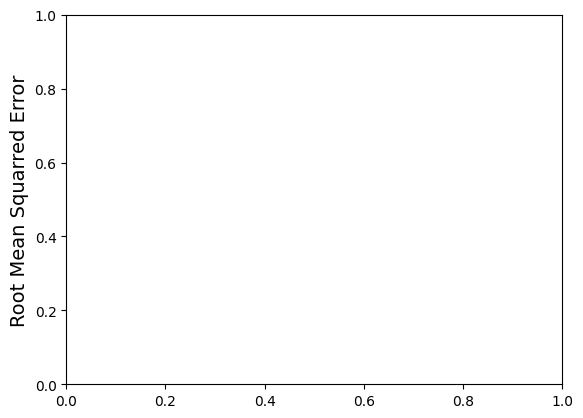

In [54]:
def plot_city_figures(original_df, city_name):
  ### YOUR CODE HERE ###
  # Get Original Data
  city_data = original_df.loc[city_name]
  dates = original_df.columns #for plotting later
  scaler = StandardScaler()
  data_raw_std = scaler.fit_transform(original_df)

  # Get standardized city data
  city_data_std = scaler.transform(original_df.loc[city_name].values.reshape(1, -1))

  n, m = original_df.shape
  # Compute covariance matrix of standardized data
  covariance_mat = np.dot(data_raw_std.T, data_raw_std) / (n-1)

  # Calculate indices for 8 evenly spaced dates (just for plotting)
  spaced_indices = np.linspace(0, len(dates) - 1, 8, dtype=int)
  spaced_dates = dates[spaced_indices]

  # Plot Original Times Series:
  plt.figure(figsize=(10, 4))
  plt.plot(dates, city_data, label="Original Data", linewidth=2)
  plt.xlabel("Dates", fontsize=14)
  plt.ylabel("Temperature", fontsize=14)
  plt.title(f"Original Data: {city_name}", fontsize=16)
  plt.xticks(spaced_dates)
  plt.show()

  # Get Principal Components:
  eigenvalues, eigenvectors = get_sorted_eigen(covariance_mat)

  # Incremental Reconstruction
  PCs = [0, 1, 2, 5, 15]  # Principal components to be used for reconstruction
  plt.figure(figsize=(10, 5))
  for i in range(5):
      # Get first x principal components
      W = eigenvectors[:, :PCs[i]]
      # Project the sample data onto these principal components
      projected_data = np.dot(city_data_std, W)
      # Reconstruct the data from the projected data
      reconstructed_data = np.dot(projected_data, W.T)
      # De-standardize the data
      reconstructed_data_nonstandard = scaler.inverse_transform(reconstructed_data).flatten()

      # Plot
      plt.plot(dates, reconstructed_data_nonstandard, label=f"PCs: {PCs[i] + 1}")
  plt.plot(dates, city_data, label = "Original Data")
  plt.xlabel("Dates", fontsize=14)
  plt.ylabel("Temperature", fontsize=14)
  plt.title(f"Reconstruction with Incremental Principal Components: {city_name}", fontsize=16)
  plt.xticks(spaced_dates)
  plt.legend()
  plt.show()

  #calculate residuals
  residuals = reconstructed_data_nonstandard.flatten() - city_data.values
  plt.tight_layout()
  plt.show()

  plt.figure(figsize=(10, 4))
  plt.plot(dates, residuals)
  plt.xlabel("Dates", fontsize = 14)
  plt.ylabel("Residuals (original - reconstruction)", fontsize = 14)
  plt.title(f"Final Reconstruction Residuals: {city_name}", fontsize = 16)
  plt.xticks(spaced_dates)
  plt.show()

  #Get RMSE Plot by doing a seperate loop:
  num_comps = 10
  RMSE = np.zeros(num_comps)
  for i in range(num_comps):
    # Get first x principal components
    W = eigenvectors[:, 0:i]
    # Project the sample data onto these principal components
    projected_data = np.dot(city_data_std, W)
    # Reconstruct the data from the projected data
    reconstructed_data = np.dot(projected_data, W.T)
    # De-standardize the data
    reconstructed_data_nonstandard = scaler.inverse_transform(reconstructed_data.reshape(1, -1)).T
    #calculate residuals
    residuals = reconstructed_data_nonstandard.flatten() - city_data.values
    #calculate RMSE
    RMSE[i] = np.sqrt(np.mean(residuals**2))

  plt.figure(figsize=(10, 4))
  plt.plot(np.arange(1,num_comps+1), RMSE)
  plt.xlabel("Number of Components", fontsize = 14)
  plt.ylabel("Root Mean Squarred Error", fontsize = 14)
  plt.title(f"RMSE of reconstruction: {city_name}", fontsize = 16)
  plt.show()

  return RMSE, reconstructed_data_nonstandard

#Loop through cities
cities = ['Yakeshi', 'Zamboanga','Norilsk', 'Juliaca', 'Doha']
for i, city in enumerate(cities):
    plot_city_figures(data_raw, city)


In [ ]:
"""
This is extra code I made originally because I thought we were supposed to plot
subplots for each new reconstruction. Didn't want to delete it all.
"""
# # Save the original indices (city names)
  # original_indices = data_raw.index
  # # Standardize
  # data_raw_std = scaler.fit_transform(data_raw)
  # # Convert standardized data back to DataFrame with original indices
  # standardized_df = pd.DataFrame(data_raw_std, index=original_indices, columns=dates)
  # # Get standardized city data
  # city_data_std = standardized_df.loc[city_name]

  # n, m = data_raw.shape
  # # Compute covariance matrix of standardized data
  # covariance_mat = np.dot(data_raw_std.T, data_raw_std) / (n-1)

  # # Calculate indices for 10 evenly spaced dates
  # spaced_indices = np.linspace(0, len(dates) - 1, 8, dtype=int)
  # spaced_dates = dates[spaced_indices]

  # # Plot Original Times Series:
  # plt.figure(figsize=(10.3, 4))
  # plt.plot(dates, city_data, label = "Original Data")
  # plt.xlabel("Dates", fontsize=14)
  # plt.ylabel("Temperature", fontsize=14)
  # plt.title(f"Original Data: {city_name}", fontsize=16)
  # plt.xticks(spaced_dates)
  # plt.show()

  # # Get Principal Components:
  # eigenvalues, eigenvectors = get_sorted_eigen(covariance_mat)

  # # Incremental Reconstruction
  # PCs = [0,1,2,5,15] #principal components to used for reconstruction

  # total_height = 20  # 4 inches per subplot
  # fig = plt.figure(figsize=(9, total_height))

  # for i in range(5):
  #   # Get first x principal components
  #   W = eigenvectors[:, 0:PCs[i]]
  #   # Project the sample data onto these principal components
  #   projected_data = np.dot(city_data_std, W)
  #   # Reconstruct the data from the projected data
  #   reconstructed_data = np.dot(projected_data, W.T)
  #   # De-standardize the data
  #   reconstructed_data_nonstandard = scaler.inverse_transform(reconstructed_data.reshape(1, -1)).T

  #   #plot
  #   ax = fig.add_subplot(5, 1, i + 1)
  #   ax.plot(dates, reconstructed_data_nonstandard, label = "Reconstruction")
  #   ax.plot(dates, city_data, label = "Original Data")
  #   ax.set_xlabel("Dates", fontsize=14)
  #   ax.set_ylabel("Temperature", fontsize=14)
  #   ax.set_title(f"{city_name} Number of Principal Components: {PCs[i]+1}", fontsize=16)
  #   # Set the custom x-ticks
  #   ax.set_xticks(spaced_dates)
  #   ax.legend()

# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison **[0.5]**, and comment on the results. **[0.5]**.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


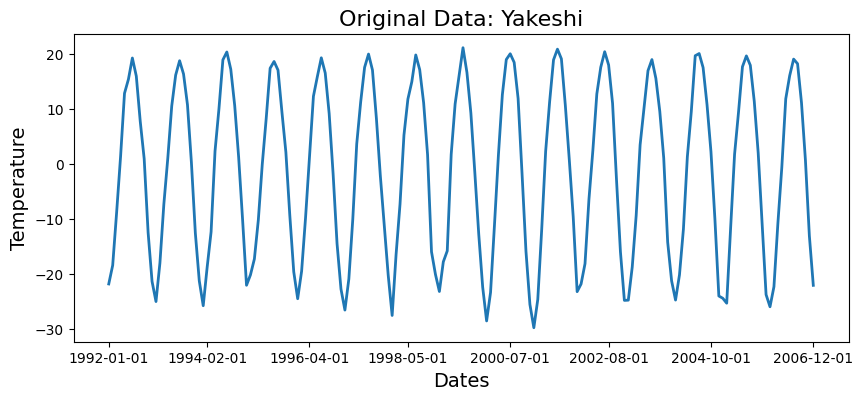

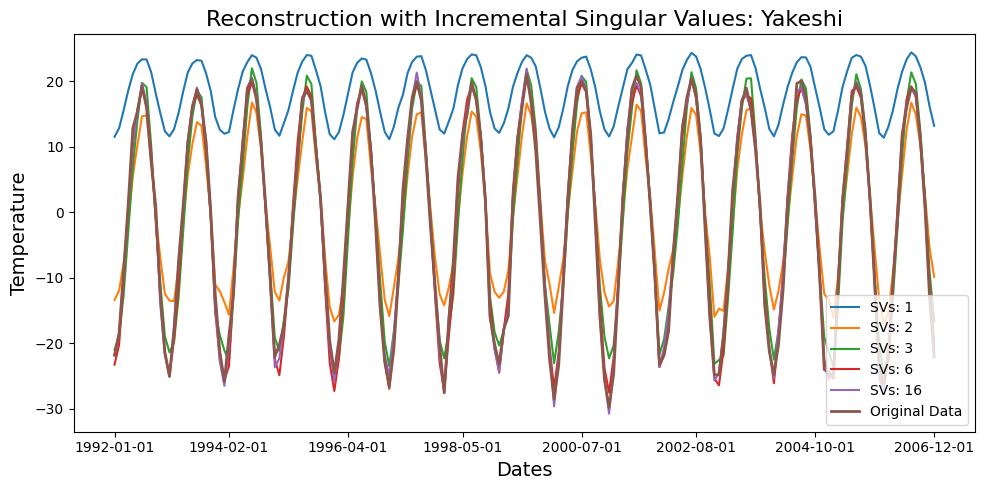

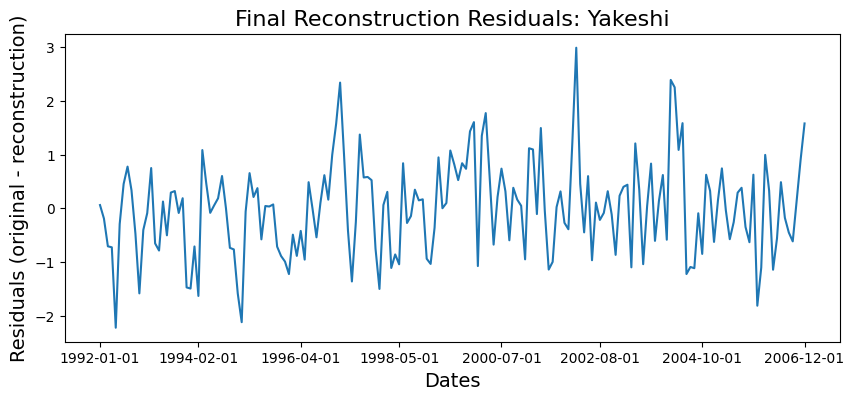

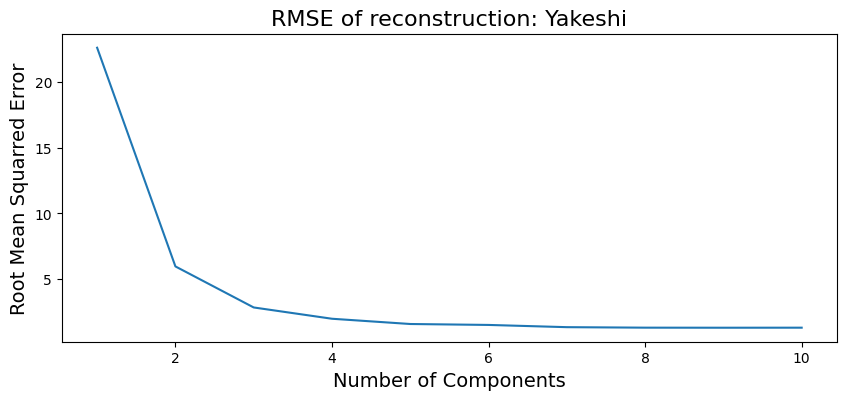

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


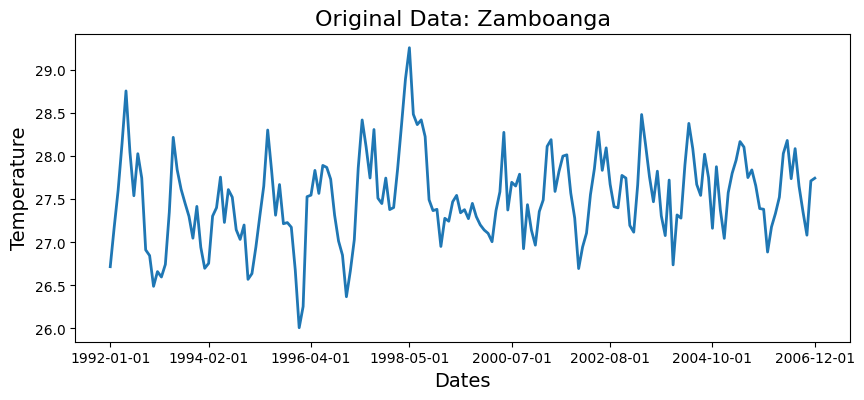

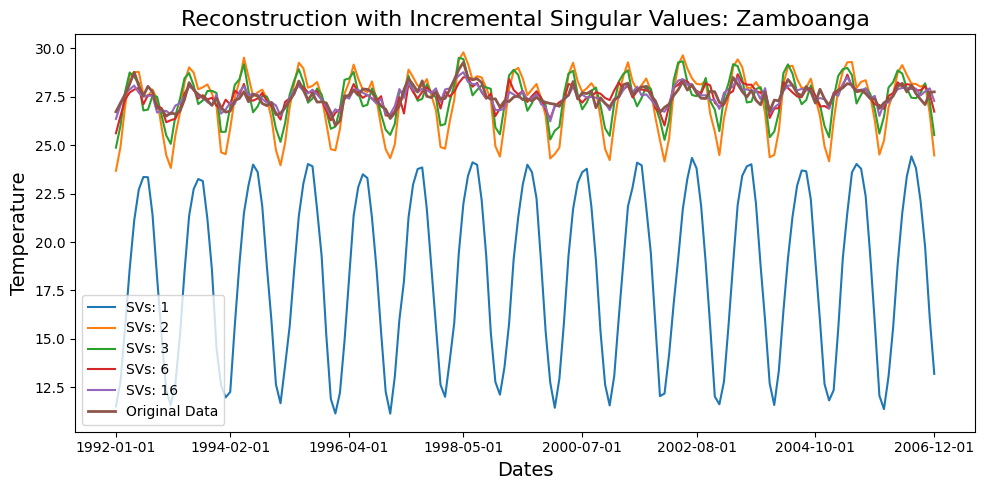

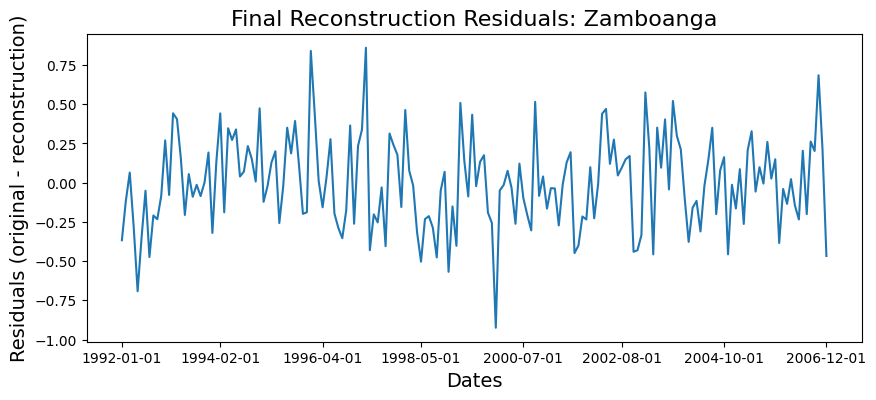

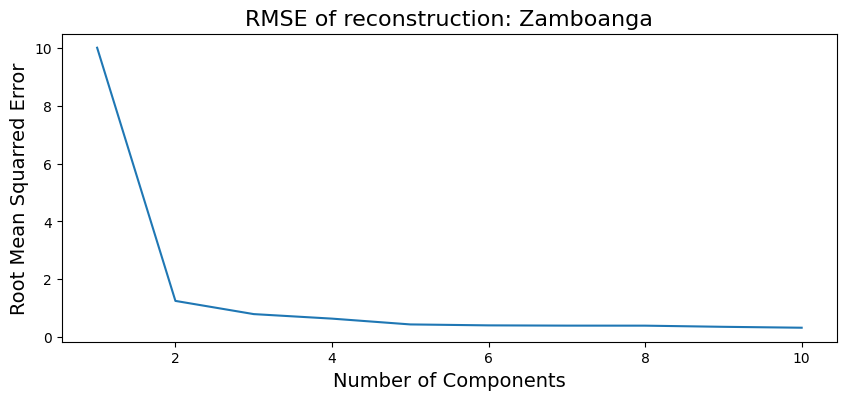

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


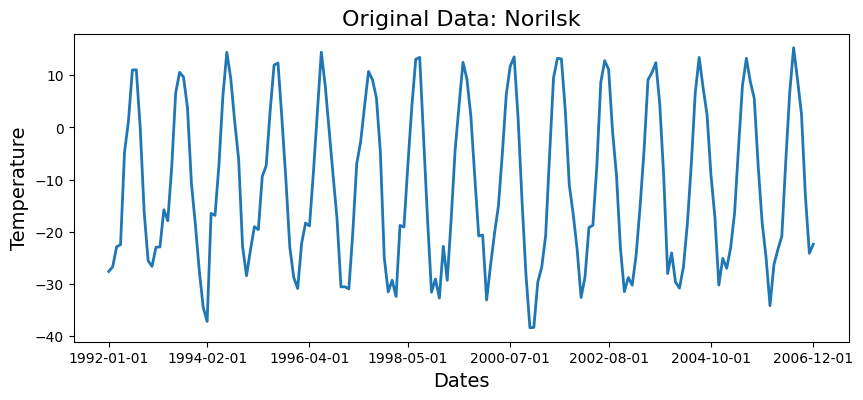

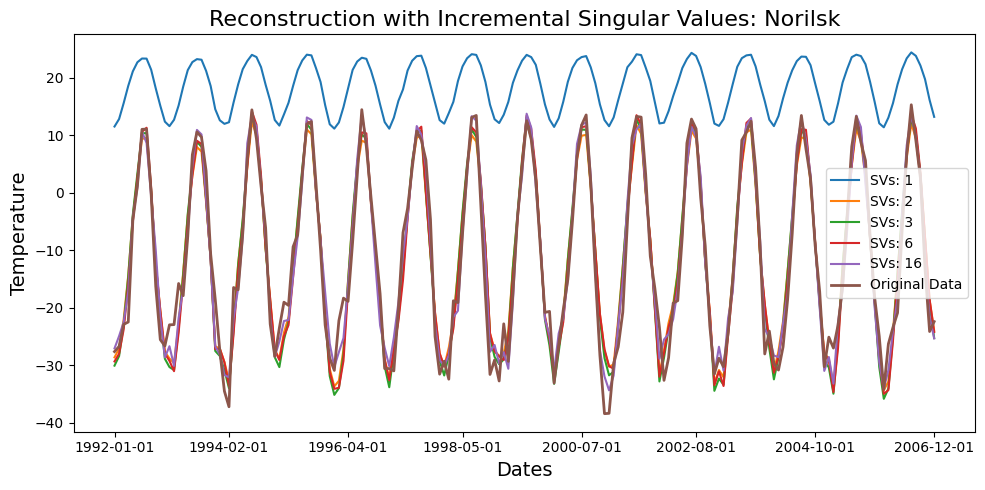

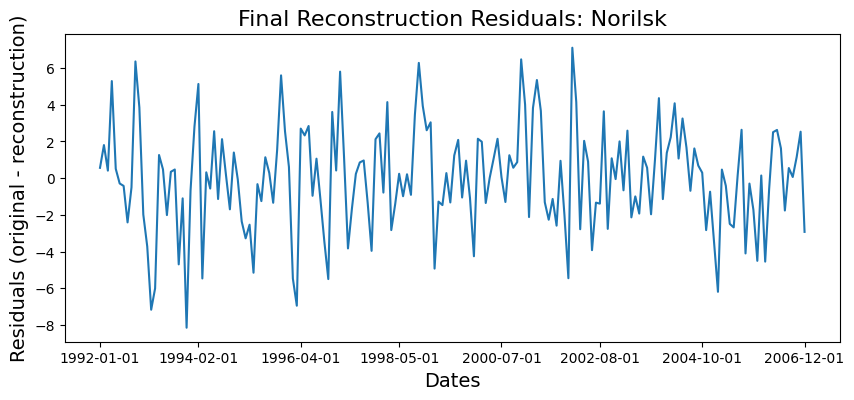

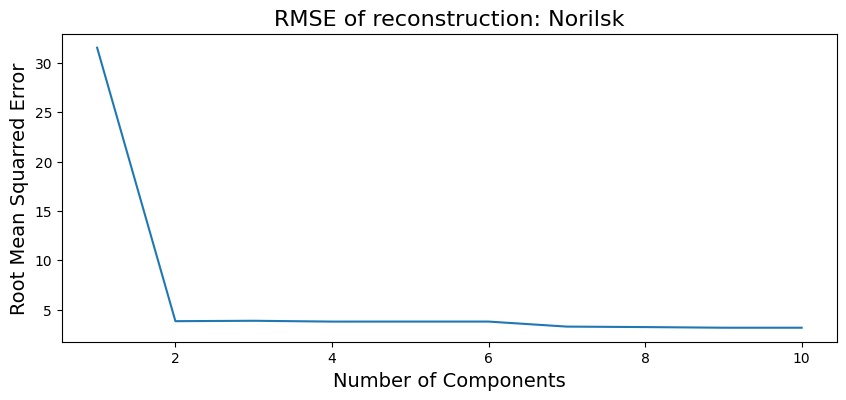

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


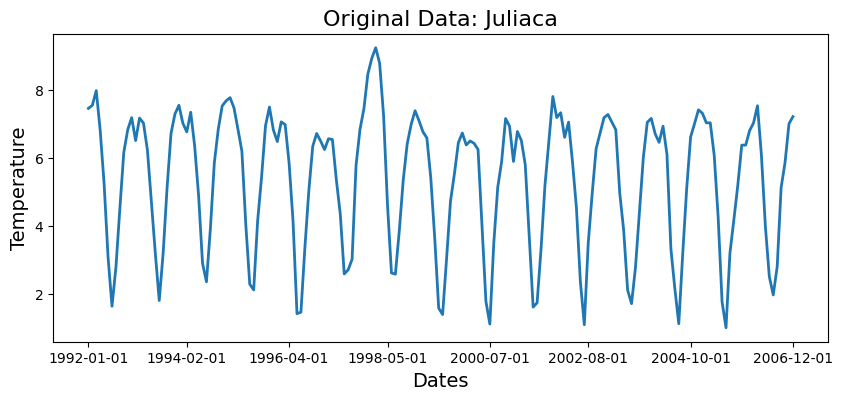

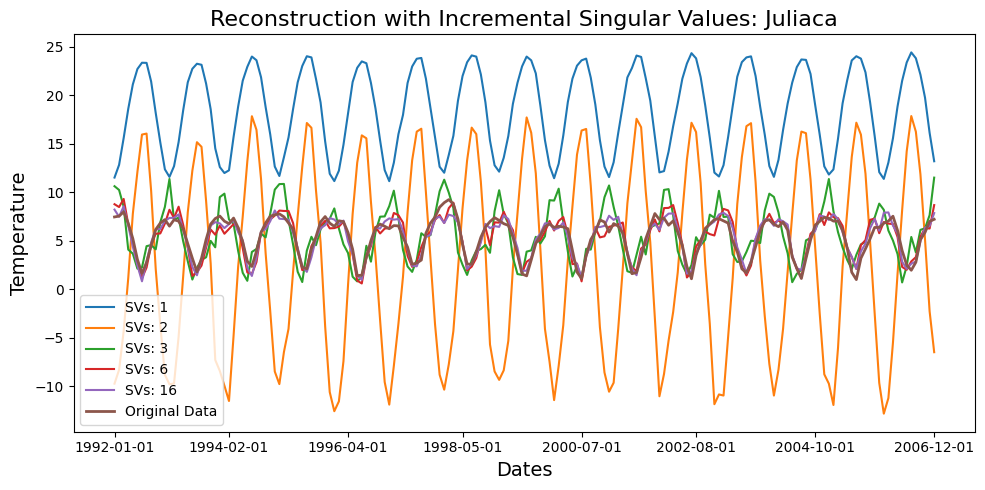

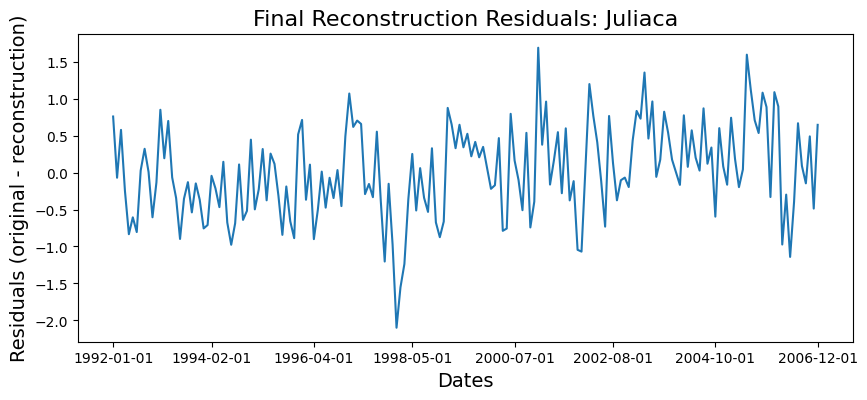

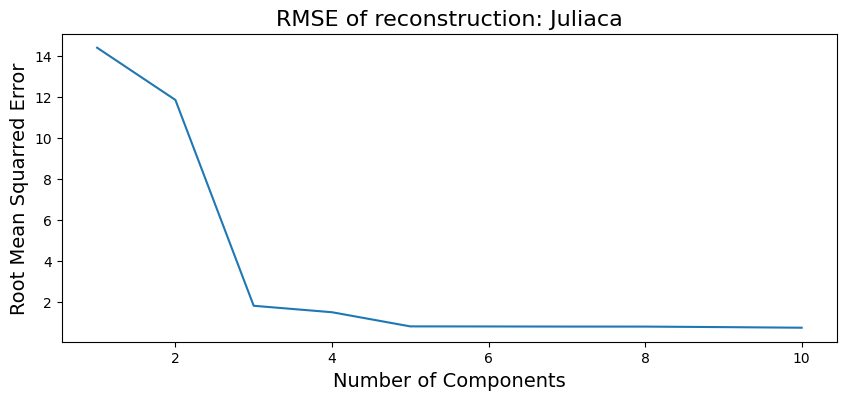

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


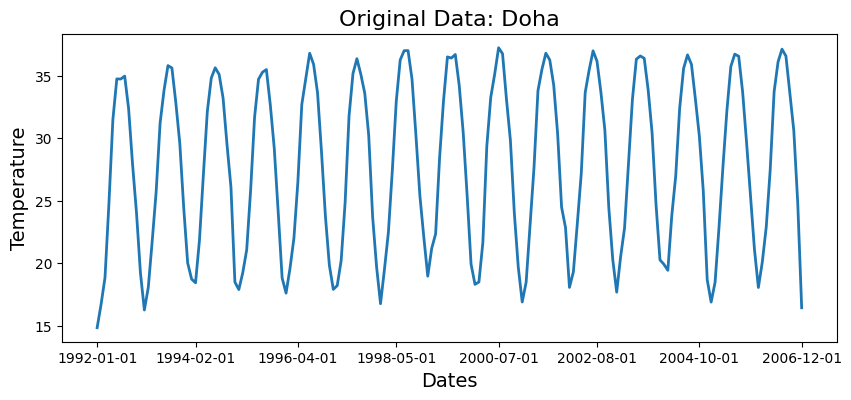

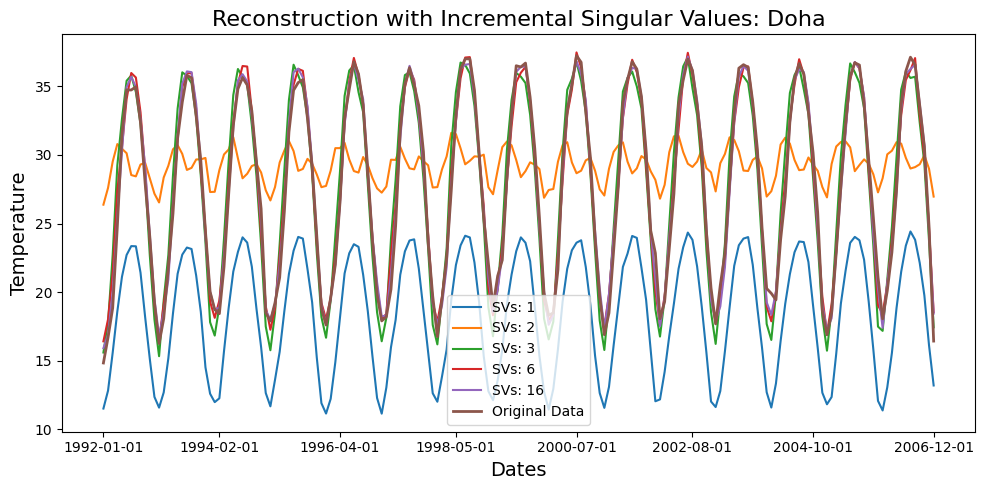

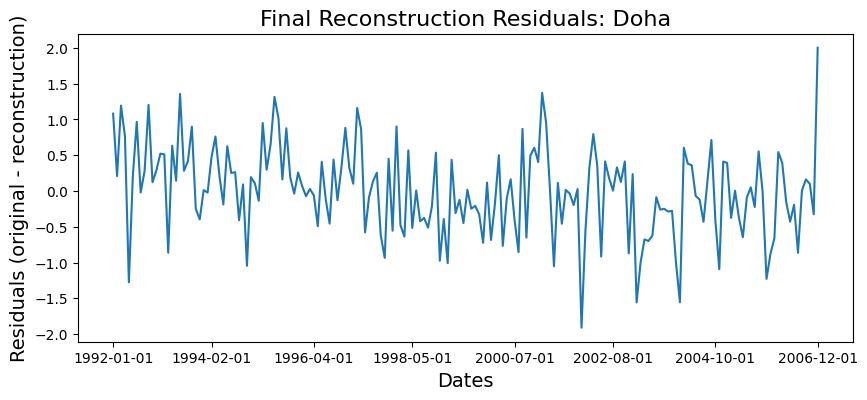

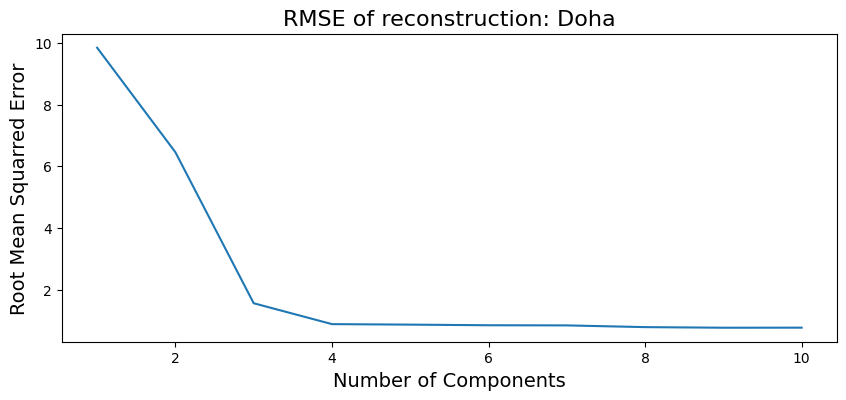

In [51]:
### YOUR CODE HERE ###
def get_sorted_singular_values_and_vectors(data_std):

    # Perform Singular Value Decomposition
    U, singular_values, Vt = np.linalg.svd(data_std)

    # U contains left singular vectors (not needed for SVD-based PCA)
    # singular_values contains the singular values
    # Vt contains the right singular vectors, which are the principal components

    return singular_values, Vt

def plot_city_figures_SVD(original_df, city_name):
    # Get Original Data
    city_data = original_df.loc[city_name]
    dates = original_df.columns #for plotting later
    scaler = StandardScaler()
    data_raw_std = scaler.fit_transform(original_df)

    # Get standardized city data
    city_data_std = scaler.transform(original_df.loc[city_name].values.reshape(1, -1))

    # Calculate indices for 8 evenly spaced dates
    spaced_indices = np.linspace(0, len(dates) - 1, 8, dtype=int)
    spaced_dates = dates[spaced_indices]

    # Plot Original Times Series:
    plt.figure(figsize=(10, 4))
    plt.plot(dates, city_data, label="Original Data", linewidth=2)
    plt.xlabel("Dates", fontsize=14)
    plt.ylabel("Temperature", fontsize=14)
    plt.title(f"Original Data: {city_name}", fontsize=16)
    plt.xticks(spaced_dates)
    plt.show()

    # Get Singular Values and Vectors:
    singular_values, Vt = get_sorted_singular_values_and_vectors(data_raw_std)

    # Incremental Reconstruction using SVD
    SVs = [0, 1, 2, 5, 15]  # Principal components to be used for reconstruction

    # Updated loop for incremental reconstruction using SVD
    plt.figure(figsize=(10, 5))
    for i in range(5):
        # Get first x singular vectors
        V = Vt[:SVs[i], :]
        # Reconstruct the data from the singular vectors by projection
        reconstructed_data = np.dot(np.dot(city_data_std, V.T), V)
        # De-standardize the data
        reconstructed_data_nonstandard = scaler.inverse_transform(reconstructed_data).flatten()
        # Plot
        plt.plot(dates, reconstructed_data_nonstandard, label=f"SVs: {SVs[i] + 1}")

    plt.plot(dates, city_data, label="Original Data", linewidth=2)
    plt.xlabel("Dates", fontsize=14)
    plt.ylabel("Temperature", fontsize=14)
    plt.title(f"Reconstruction with Incremental Singular Values: {city_name}", fontsize=16)
    plt.xticks(spaced_dates)
    plt.legend()
    plt.tight_layout()
    plt.show()

    #calculate residuals
    residuals = reconstructed_data_nonstandard.flatten() - city_data.values

    plt.figure(figsize=(10, 4))
    plt.plot(dates, residuals)
    plt.xlabel("Dates", fontsize = 14)
    plt.ylabel("Residuals (original - reconstruction)", fontsize = 14)
    plt.title(f"Final Reconstruction Residuals: {city_name}", fontsize = 16)
    plt.xticks(spaced_dates)
    plt.show()

    #Get RMSE Plot by doing a seperate loop:
    num_comps = 10
    RMSE = np.zeros(num_comps)
    for i in range(num_comps):
      # Get first x singular vectors
      V = Vt[:i, :]
      # Reconstruct the data from the singular vectors
      reconstructed_data = np.dot(np.dot(city_data_std, V.T), V)
      # De-standardize the data
      reconstructed_data_nonstandard = scaler.inverse_transform(reconstructed_data).flatten()
      #calculate residuals
      residuals = reconstructed_data_nonstandard.flatten() - city_data.values
      #calculate RMSE
      RMSE[i] = np.sqrt(np.mean(residuals**2))

    plt.figure(figsize=(10, 4))
    plt.plot(np.arange(1,num_comps+1), RMSE)
    plt.xlabel("Number of Components", fontsize = 14)
    plt.ylabel("Root Mean Squarred Error", fontsize = 14)
    plt.title(f"RMSE of reconstruction: {city_name}", fontsize = 16)
    plt.show()

    return RMSE, reconstructed_data_nonstandard

cities = ['Yakeshi', 'Zamboanga','Norilsk', 'Juliaca', 'Doha']
for city in cities:
  plot_city_figures_SVD(data_raw, city)


Standardization is probably not required for SVD, since for any given city, each feature (in this case date) will have the same units and scale as all the other features for that sample. Additionally, covariance calculation is unnecesary for SVD since it is applied directly to the data matrix.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


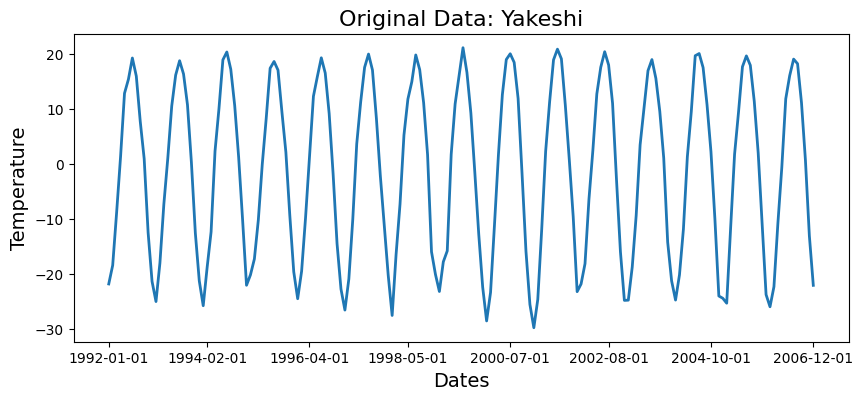

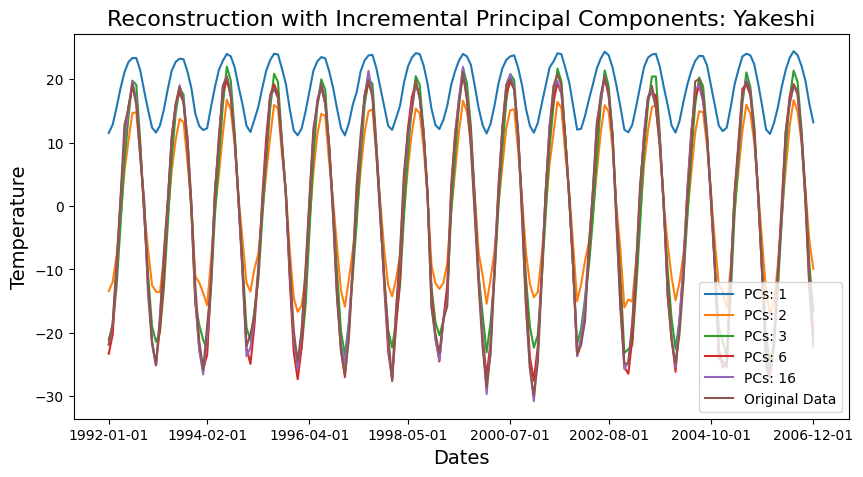

<Figure size 640x480 with 0 Axes>

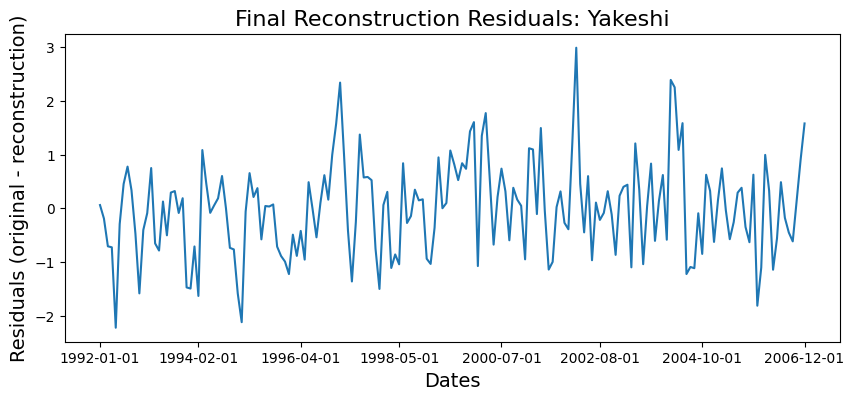

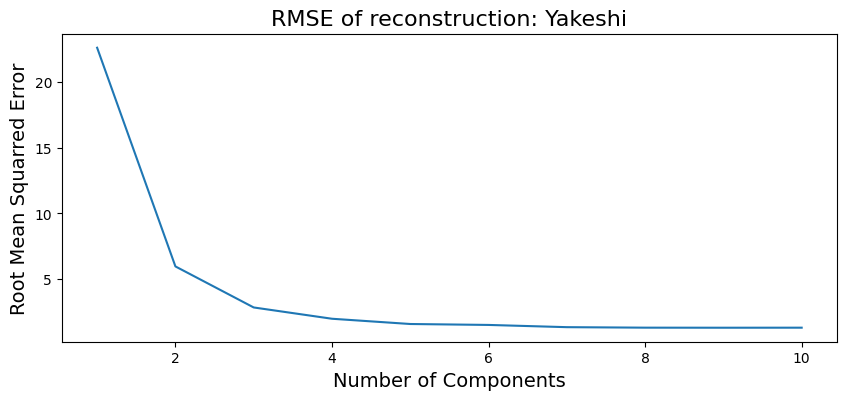

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


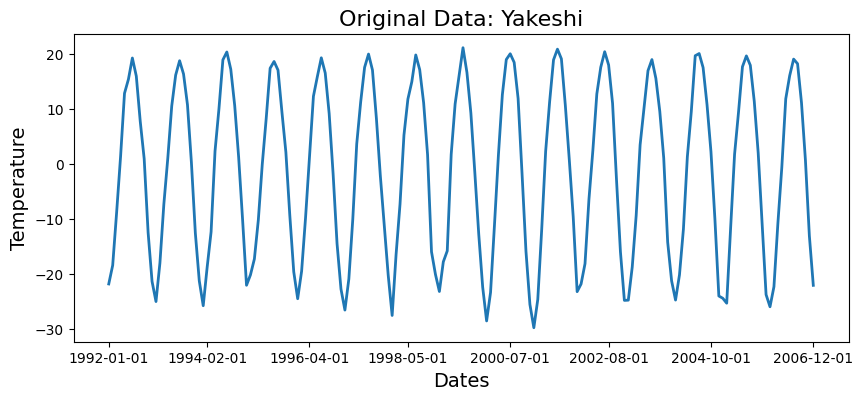

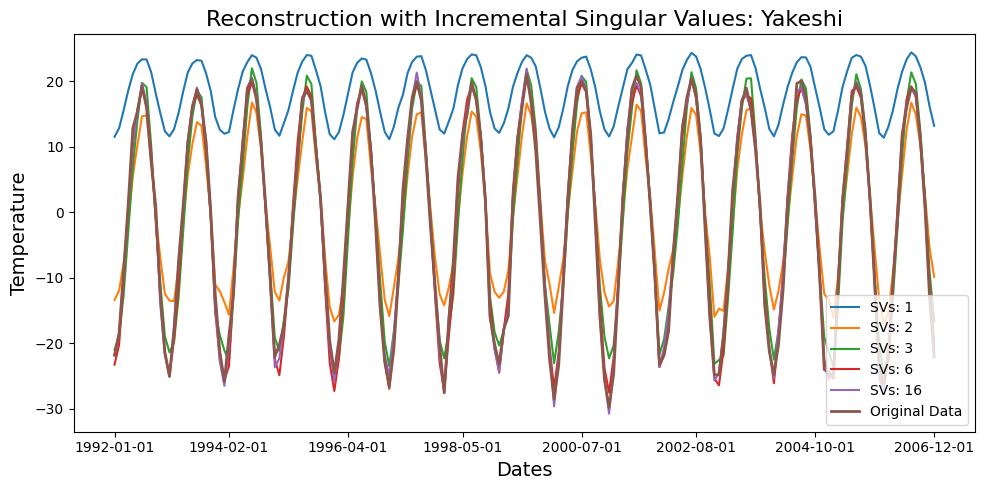

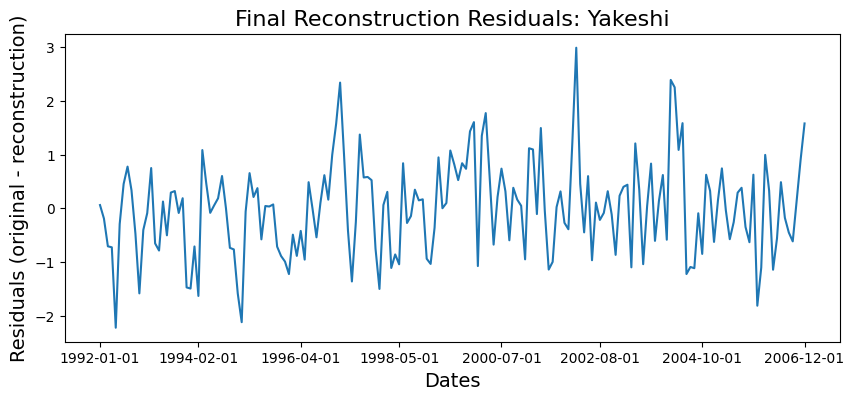

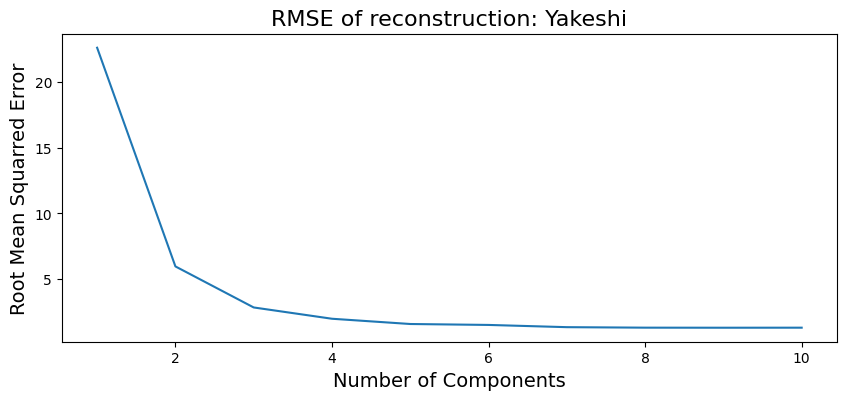

Final RMSE for PCA (Yakeshi): 1.2864530127577278
Final RMSE for SVD (Yakeshi): 1.2864530127577292


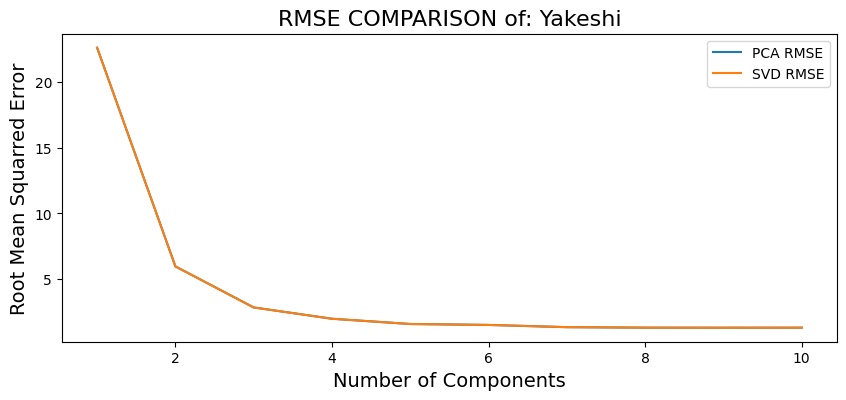

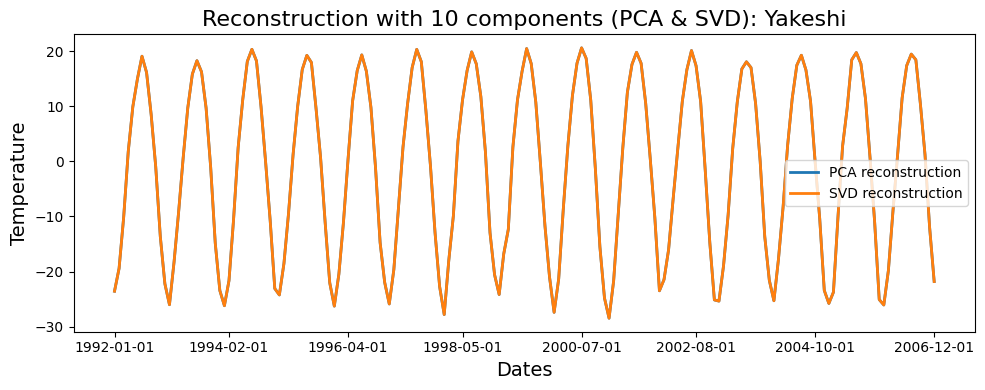

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


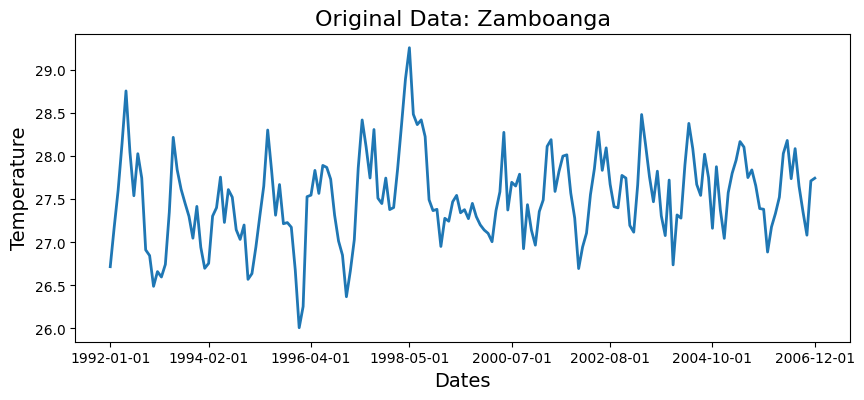

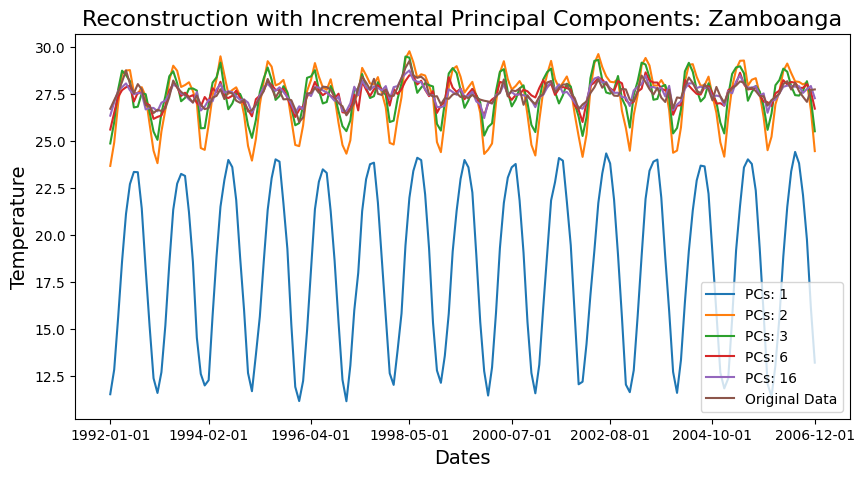

<Figure size 640x480 with 0 Axes>

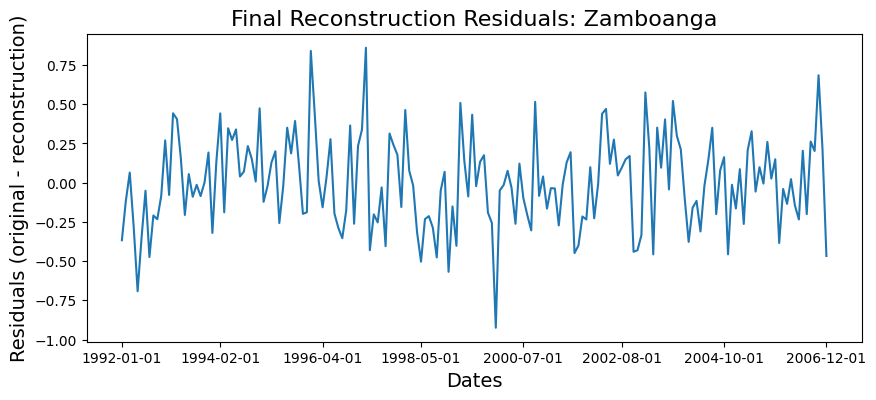

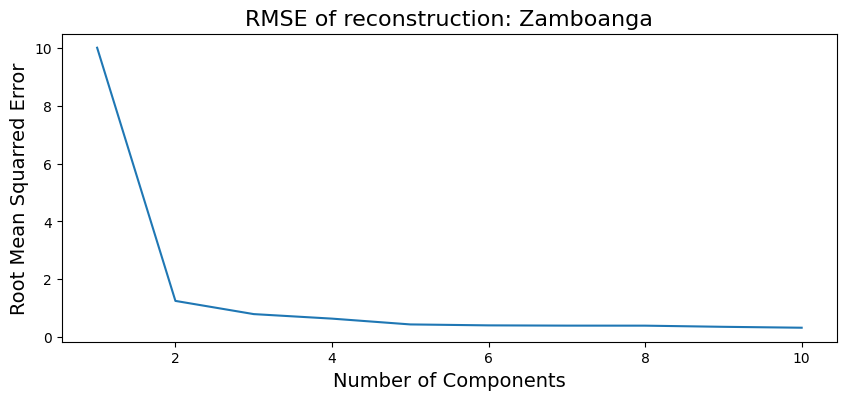

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


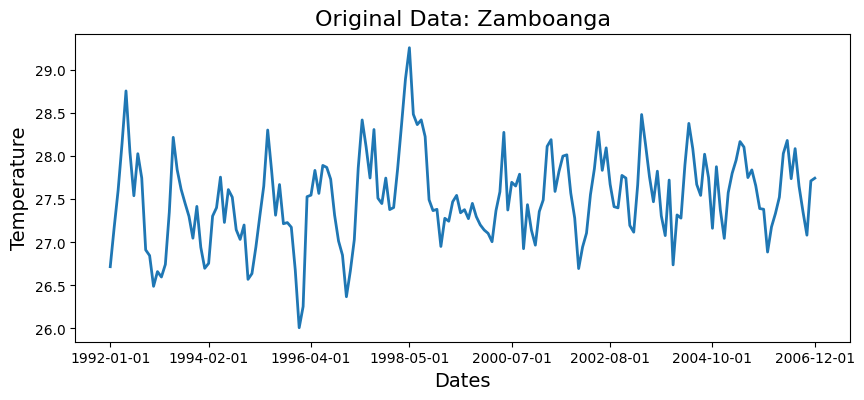

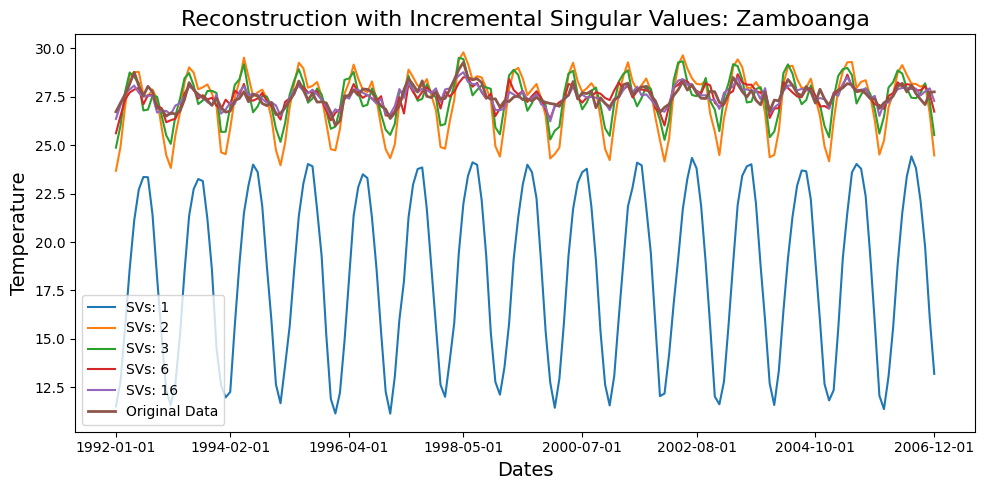

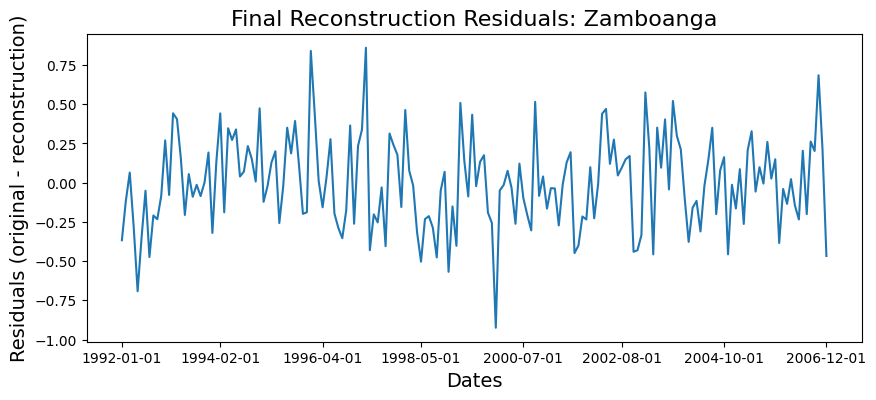

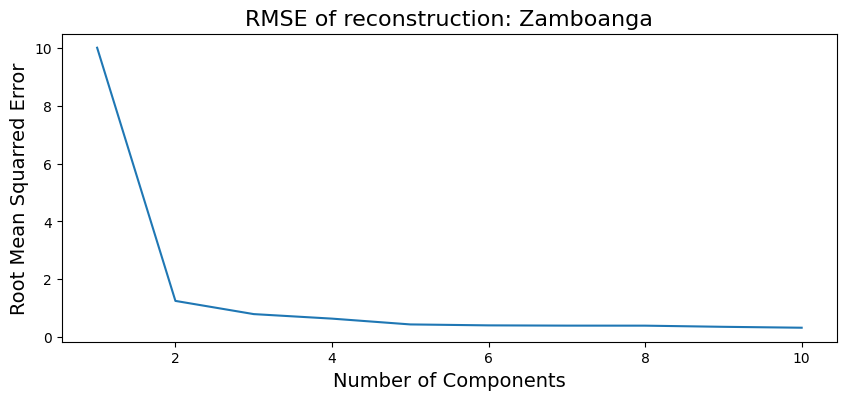

Final RMSE for PCA (Zamboanga): 0.3221469423093145
Final RMSE for SVD (Zamboanga): 0.3221469423093129


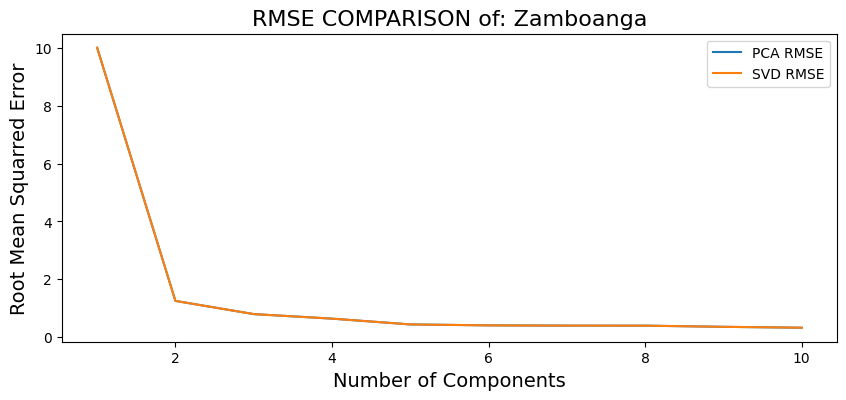

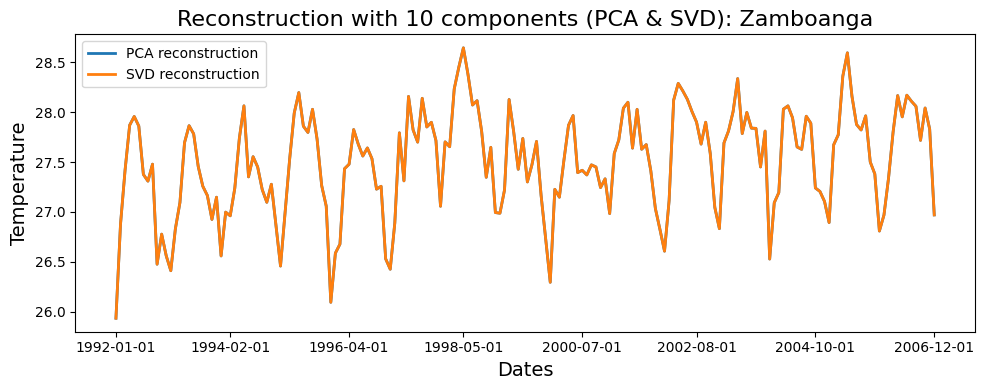

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


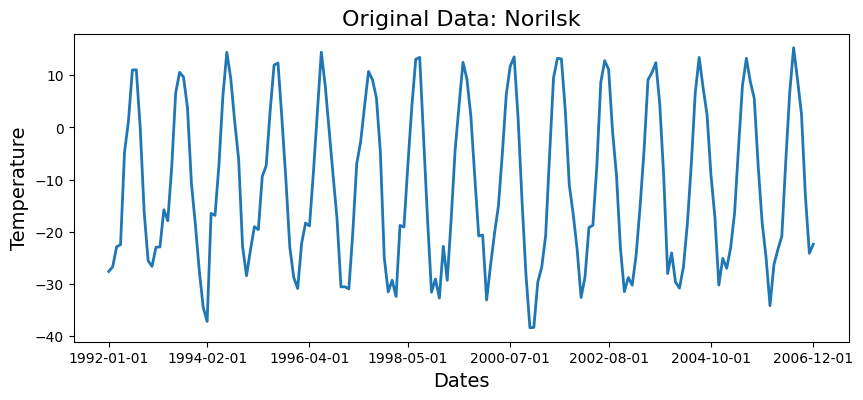

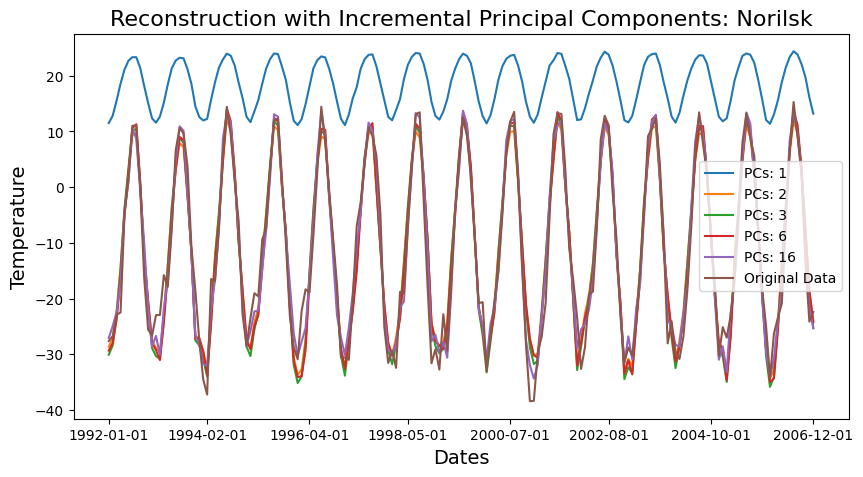

<Figure size 640x480 with 0 Axes>

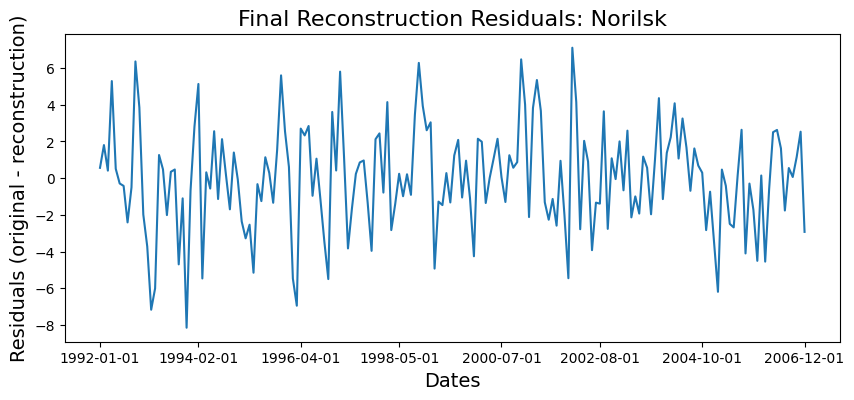

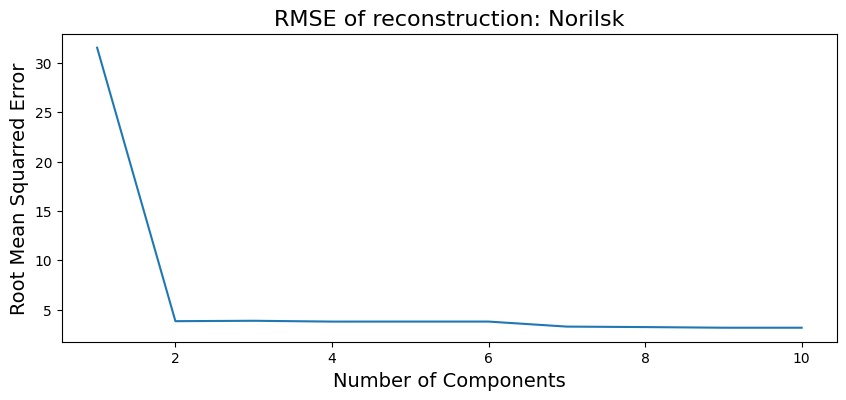

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


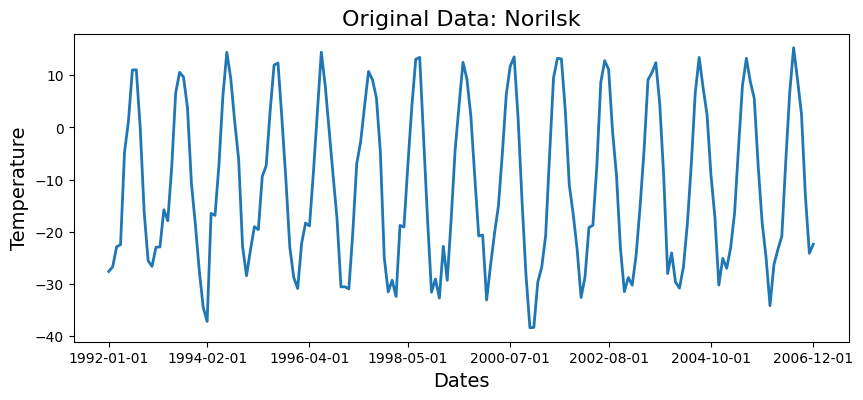

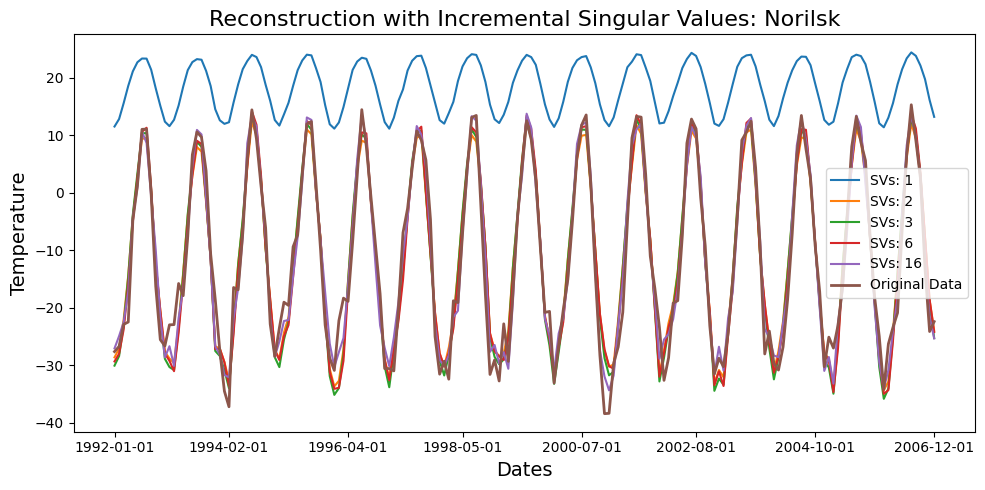

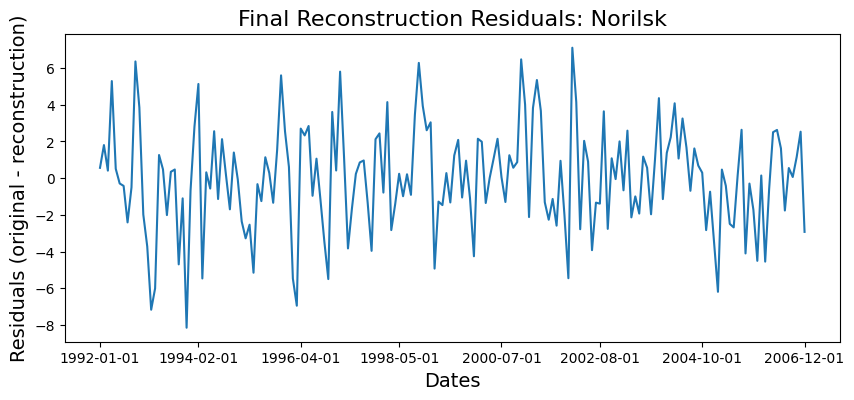

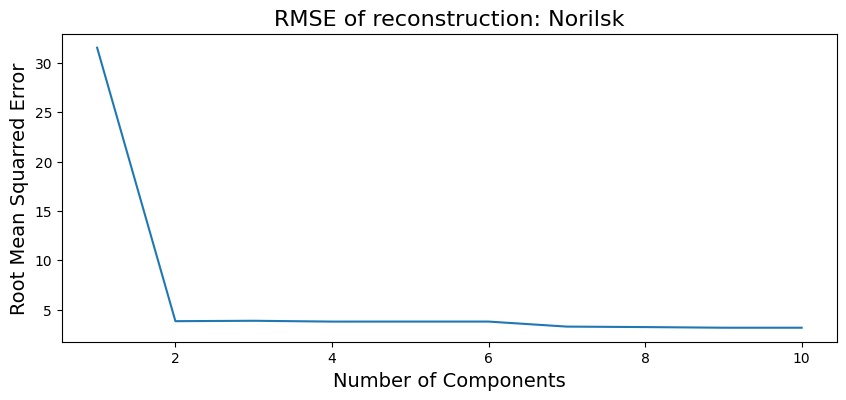

Final RMSE for PCA (Norilsk): 3.1624862061284147
Final RMSE for SVD (Norilsk): 3.162486206128415


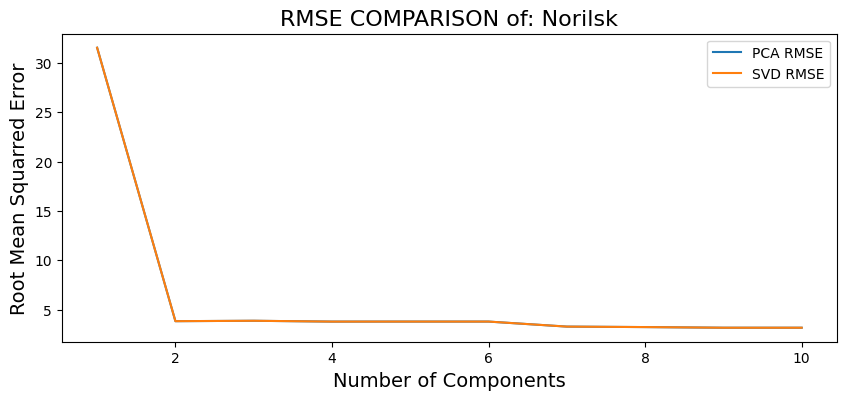

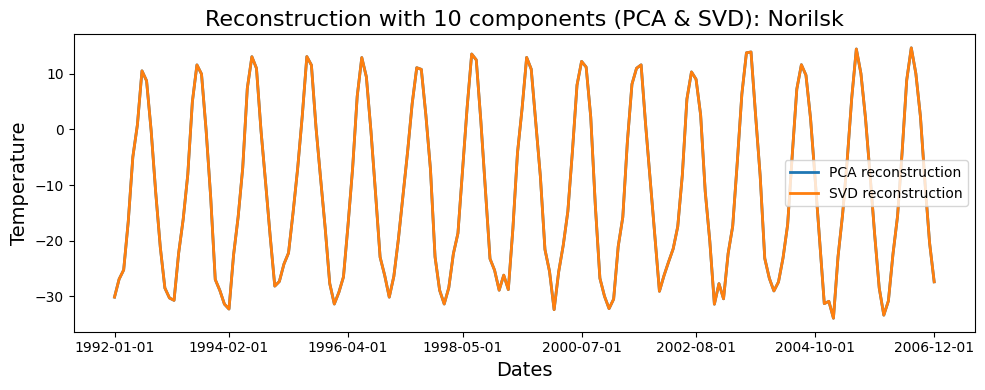

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


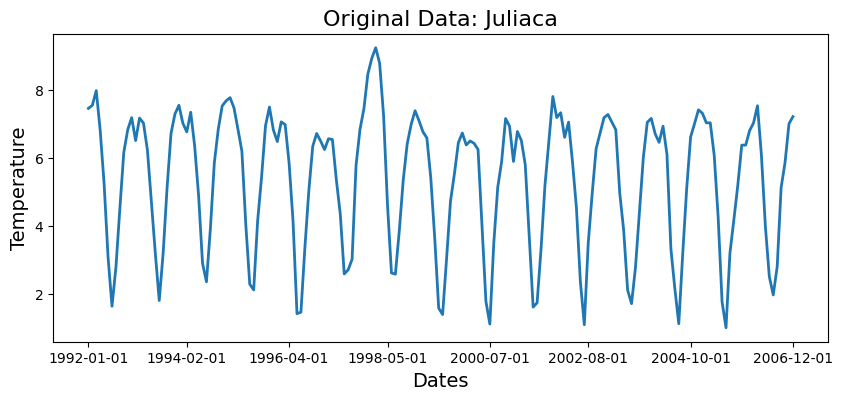

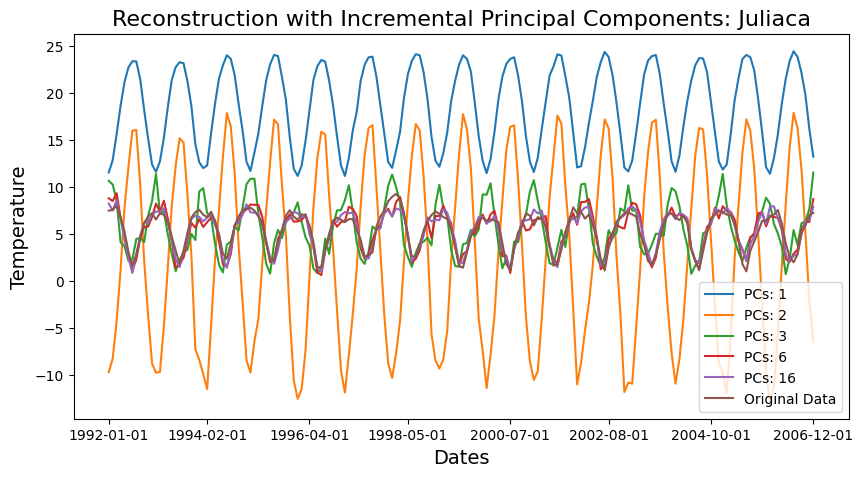

<Figure size 640x480 with 0 Axes>

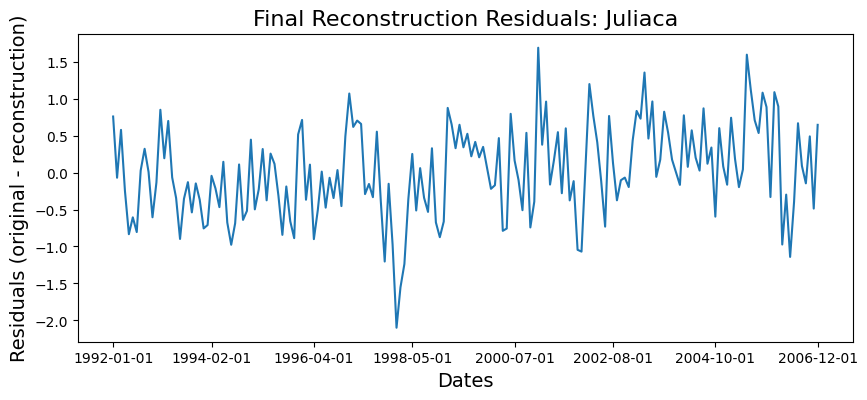

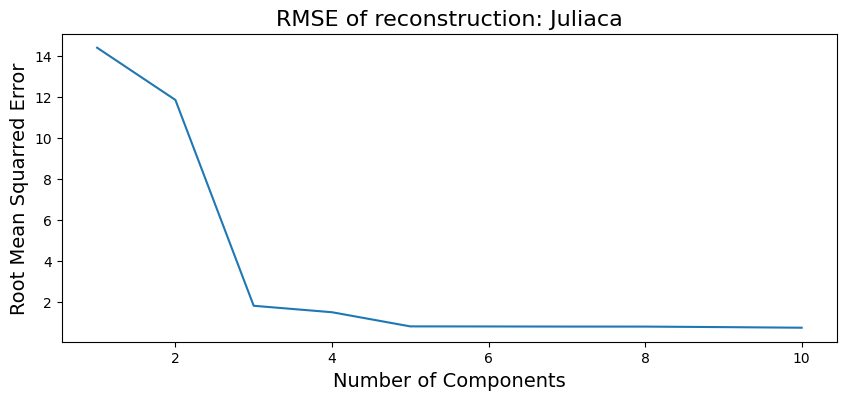

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


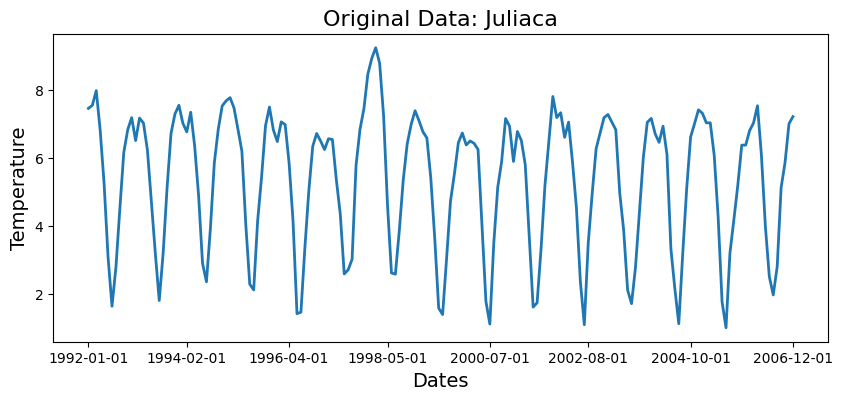

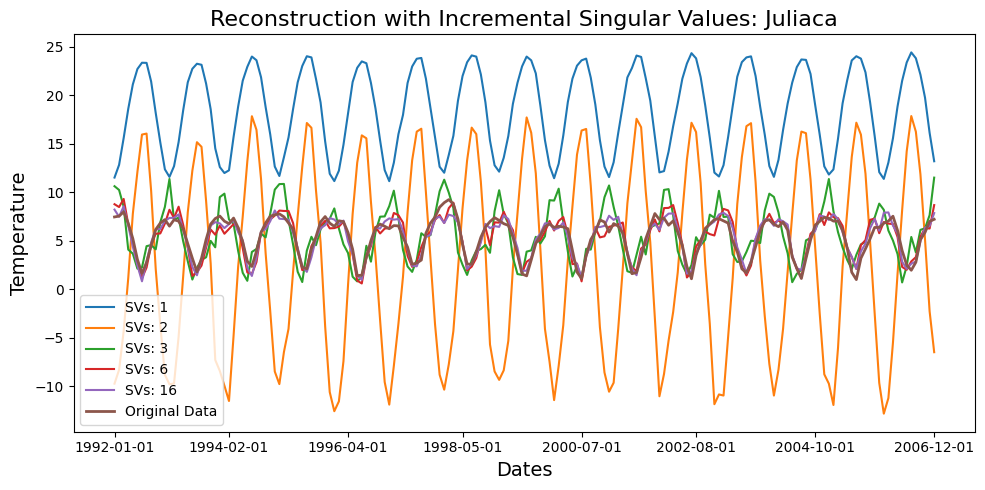

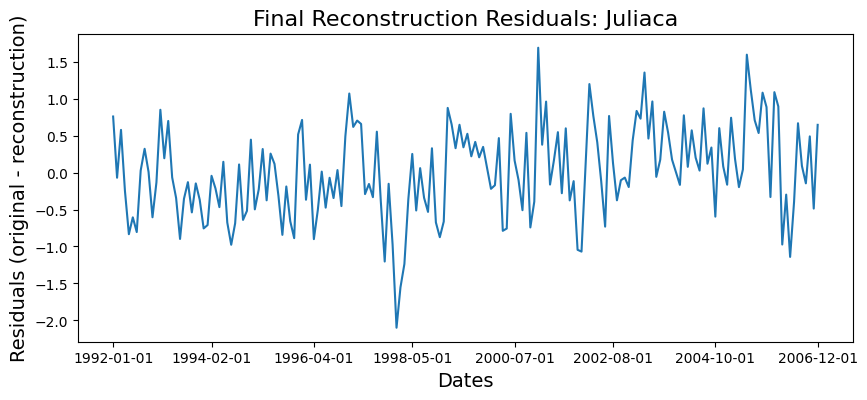

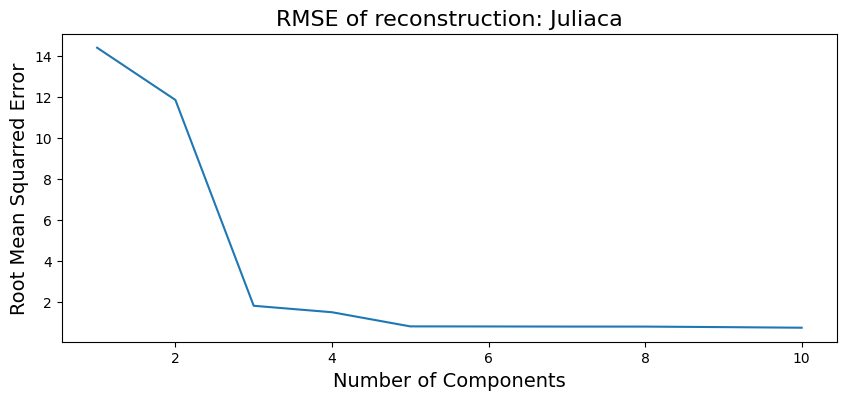

Final RMSE for PCA (Juliaca): 0.7616793110248988
Final RMSE for SVD (Juliaca): 0.7616793110249025


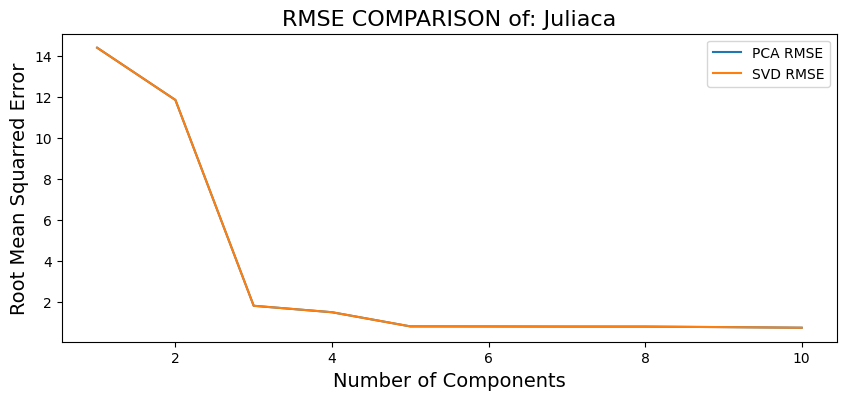

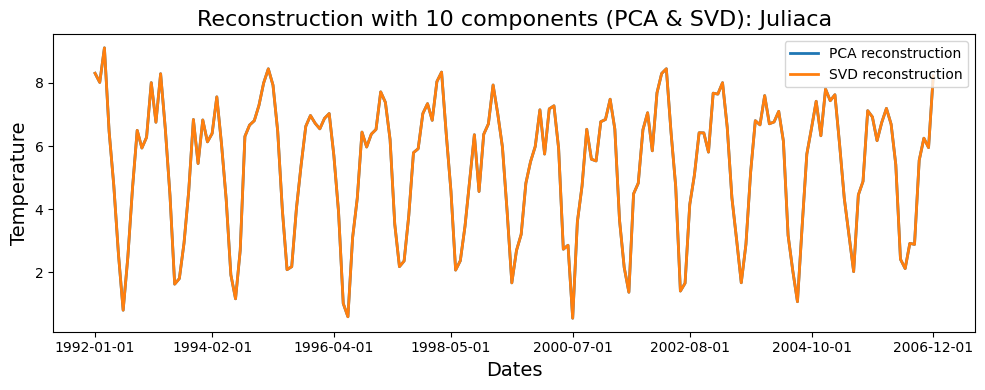

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


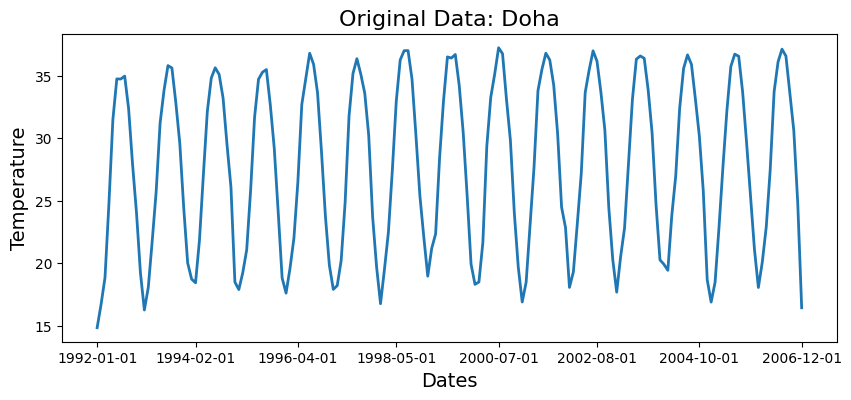

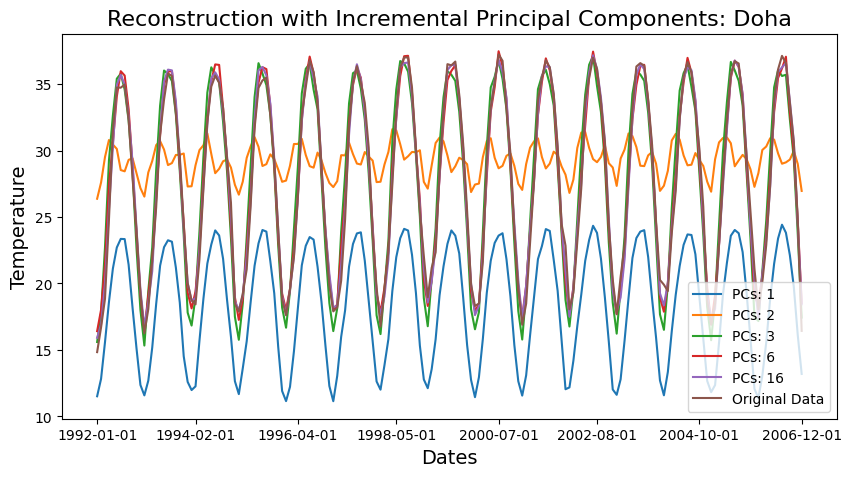

<Figure size 640x480 with 0 Axes>

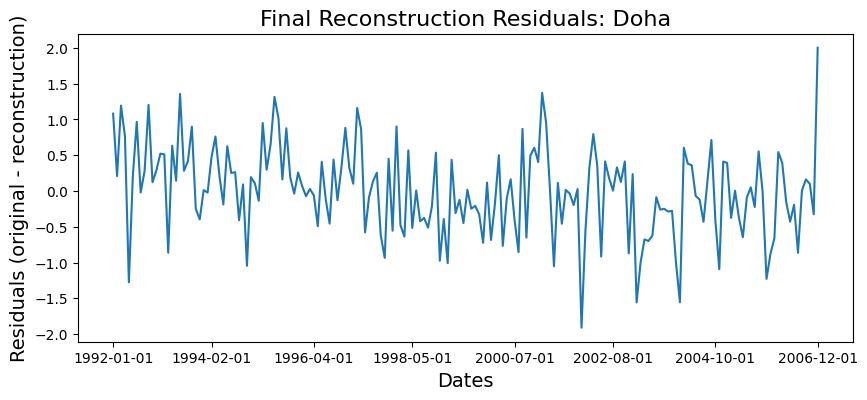

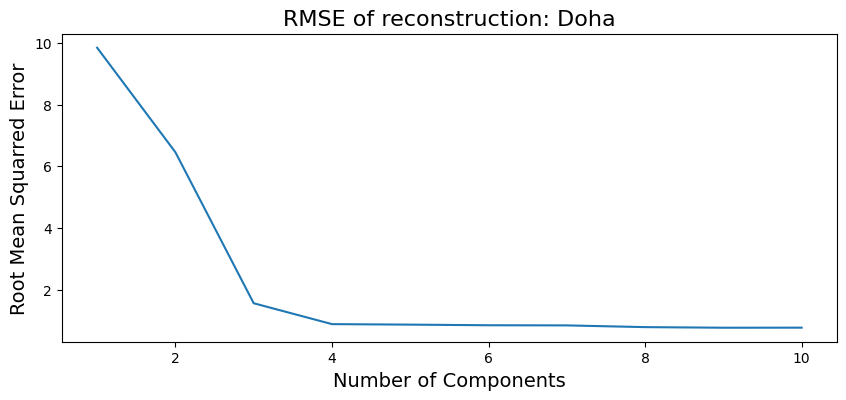

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


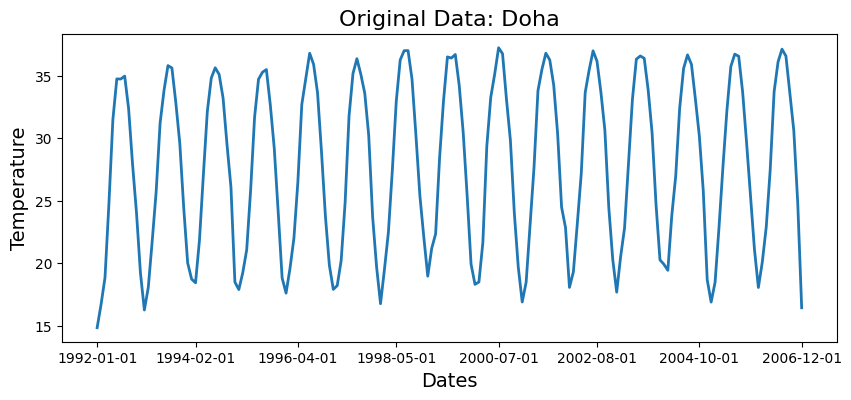

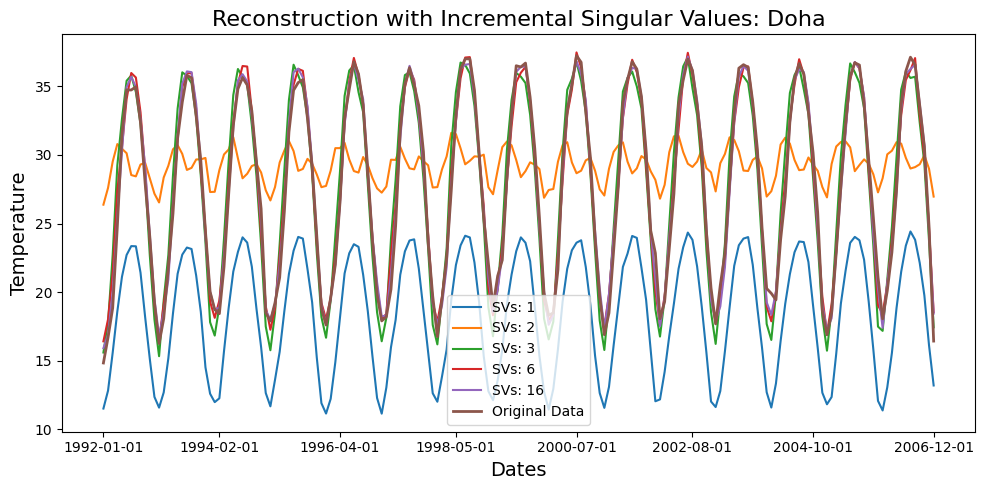

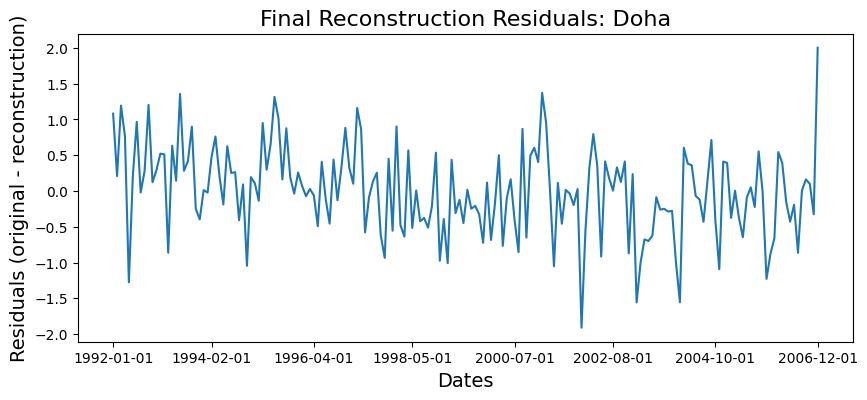

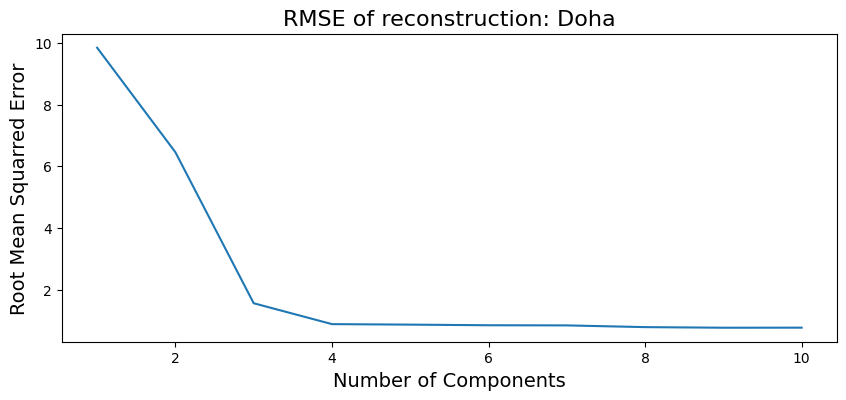

Final RMSE for PCA (Doha): 0.7718929250638713
Final RMSE for SVD (Doha): 0.7718929250638681


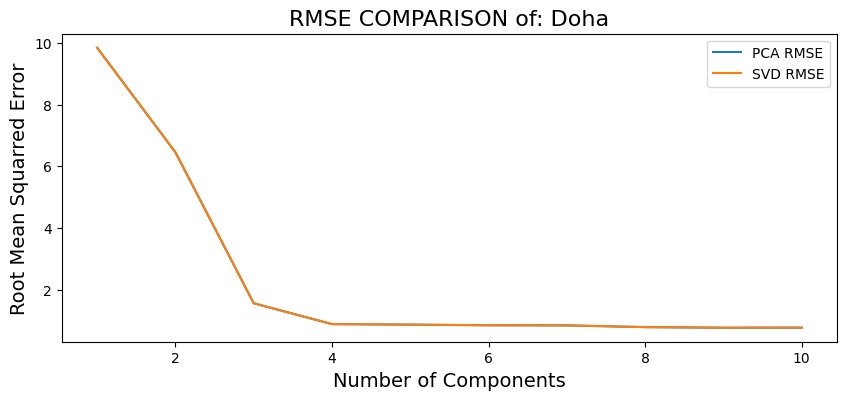

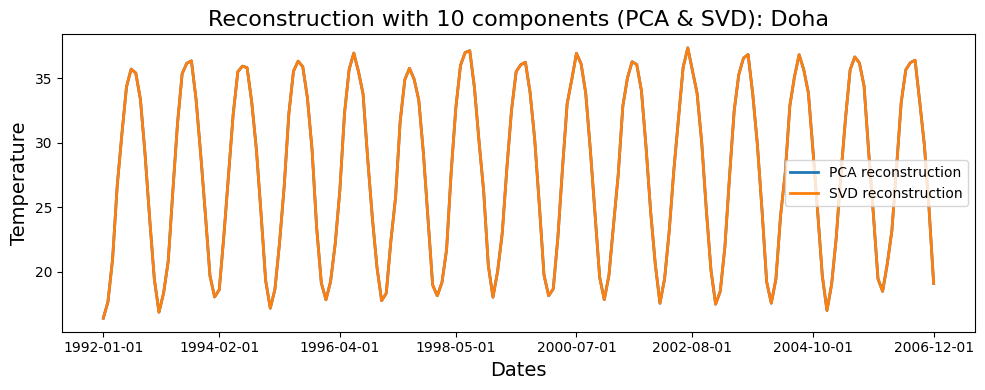

In [55]:
"""
It's unclear as to how we're exactly meant to compare them, so I'm only
going to compare the RMSE's and final reconstruction, as I feel that's sufficient.
"""

def compare_pca_svd_rmse(original_df, city_name):

    # Get dates
    dates = original_df.columns

    # Calculate indices for 8 evenly spaced dates for plotting
    spaced_indices = np.linspace(0, len(dates) - 1, 8, dtype=int)
    spaced_dates = dates[spaced_indices]

    # Run PCA and SVD functions and get RMSEs
    rmse_pca, pca_reconstruction = plot_city_figures(original_df, city_name)
    rmse_svd, svd_reconstruction = plot_city_figures_SVD(original_df, city_name)

    # Compare RMSEs
    print(f"Final RMSE for PCA ({city_name}): {rmse_pca[-1]}")
    print(f"Final RMSE for SVD ({city_name}): {rmse_svd[-1]}")

    # Plot the RMSEs for visual comparison
    plt.figure(figsize=(10, 4))
    plt.plot(np.arange(1,11), rmse_pca, label = "PCA RMSE")
    plt.plot(np.arange(1,11), rmse_svd, label = "SVD RMSE")
    plt.xlabel("Number of Components", fontsize = 14)
    plt.ylabel("Root Mean Squarred Error", fontsize = 14)
    plt.title(f"RMSE COMPARISON of: {city_name}", fontsize = 16)
    plt.legend()
    plt.show()

    # Plot the reconstructions
    plt.figure(figsize=(10, 4))
    plt.plot(dates, pca_reconstruction, label="PCA reconstruction", linewidth=2)
    plt.plot(dates, svd_reconstruction, label="SVD reconstruction", linewidth=2)
    plt.xlabel("Dates", fontsize=14)
    plt.ylabel("Temperature", fontsize=14)
    plt.title(f"Reconstruction with 10 components (PCA & SVD): {city_name}", fontsize=16)
    plt.xticks(spaced_dates)
    plt.legend()
    plt.tight_layout()
    plt.show()

#Perform Comparison For all cities.
cities = ['Yakeshi', 'Zamboanga','Norilsk', 'Juliaca', 'Doha']
for city in cities:
  compare_pca_svd_rmse(data_raw, city)


If we compare the RMSE curves for each city using the final plot as done in the new comparison function, for every single city the RMSE is the exact same for both SVD and PCA. This makes sense, since taking the singular value decomposition of a standardized dataset is the same as taking the principal components. If we were to compare the squared singular values and the eigenvalues of the covariance matrix, they'd be nearly identical. This shows that standardized SVD and PCA are essentially the same operation with different steps.


# Part 5: Let's collect another dataset! [2 Marks]
Create another dataset similar to the one provided in your handout using the raw information on average temperatures per states (not cities) provided [here](https://github.com/Sabaae/Dataset/blob/main/TemperaturesbyState.csv). **[1]**

You need to manipulate the data to organize it in the desired format (i.e., the same format that was in previous parts). If there is a missing value for the average temperature of a particular state at a given date, make sure to remove that date completely from the dataset, even if the data of that specific date exists for other states.

You are free to use any tools you like, from Excel to Python! In the end, you should have a new CSV file with more dates (features) compared to the provided dataset. How many features does the final dataset have? How many states are there?


Upload your new dataset (in CSV format) to your colab notebook and repeat part 4. When analyzing the states, you may use `Jilin`, `Nunavut`, `Rio Grande Do Norte`, `Louisiana`, and `Tasmania`. **[1]**


The code below helps you to upload your new CSV file to your colab session.

In [ ]:
# load train.csv to Google Colab
from google.colab import files
uploaded = files.upload()

Saving TemperaturesbyState.csv to TemperaturesbyState.csv


In [47]:
### YOUR CODE HERE ###
def reformat_temperature_data(filename):
    # Load data
    df = pd.read_csv(filename)

    # Pivot the DataFrame: states as rows, dates as columns, average temperatures as values
    pivoted_df = df.pivot(index='State', columns='dt', values='AverageTemperature')

    # Drop columns (dates) with any missing values
    cleaned_df = pivoted_df.dropna(axis=1, how='any')

    return cleaned_df

reformatted_state_data = reformat_temperature_data('TemperaturesbyState.csv')
print("Reformatted data shape: ", reformatted_state_data.shape)

Reformatted data shape:  (241, 608)


Therefore, the reformatted data has 241 rows (each corresponding to a state) and 608 features (each corresponding to a date).

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


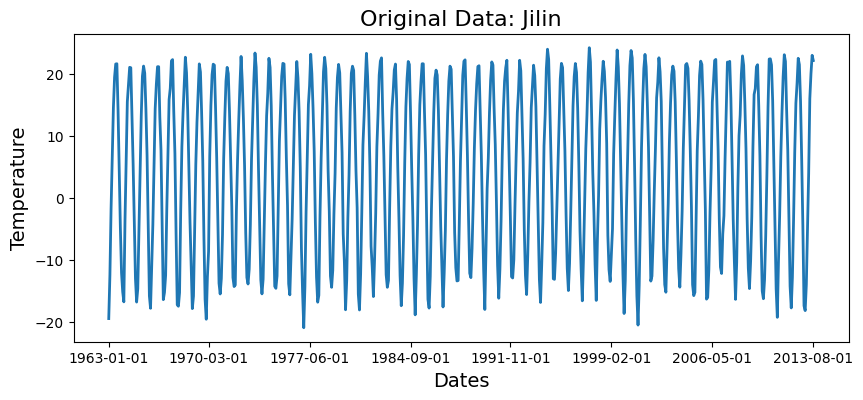

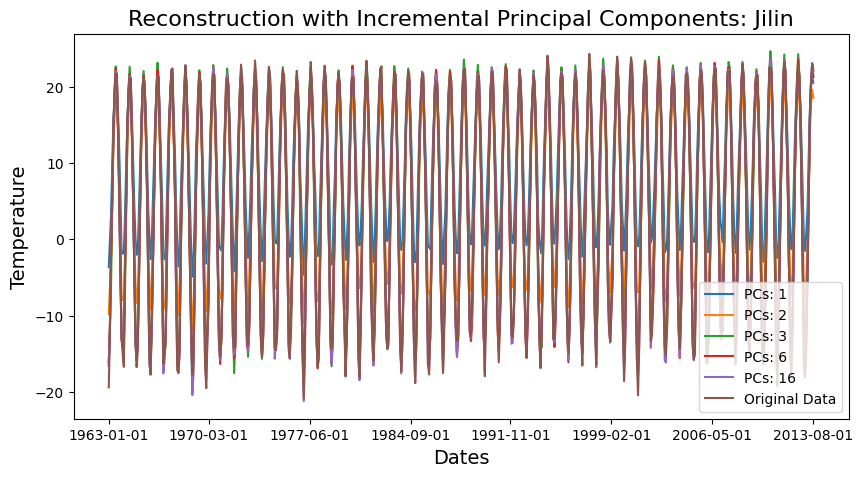

<Figure size 640x480 with 0 Axes>

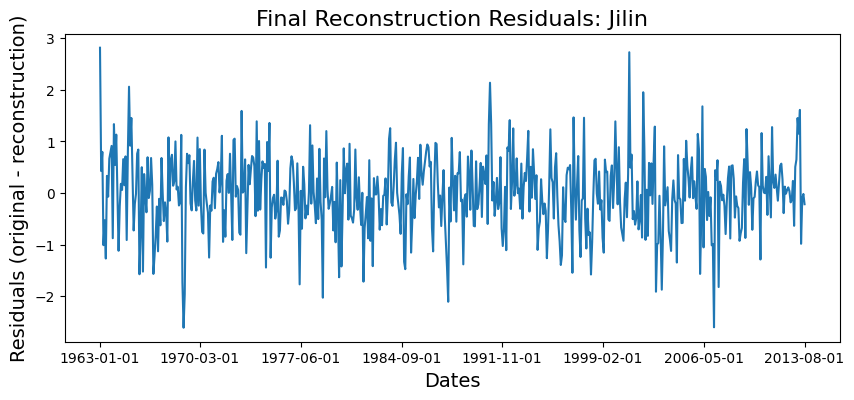

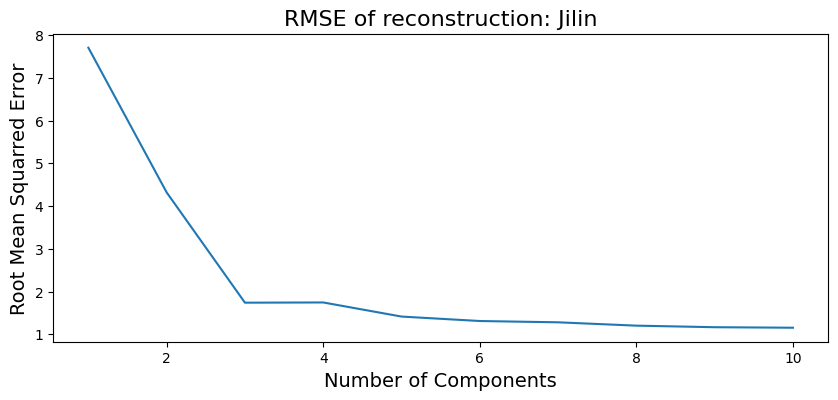

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


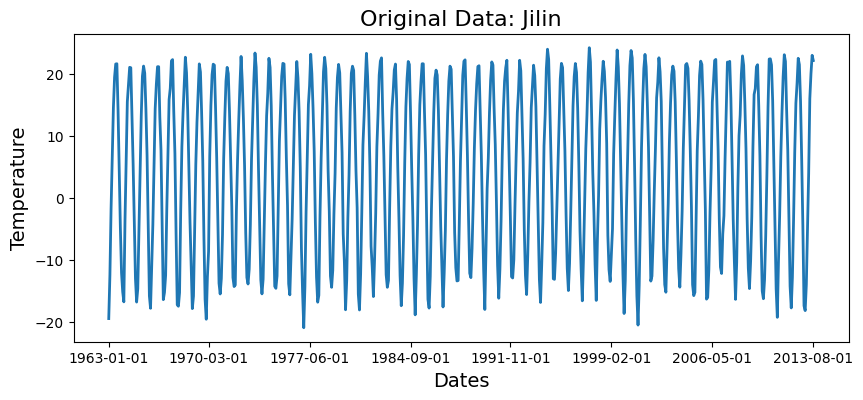

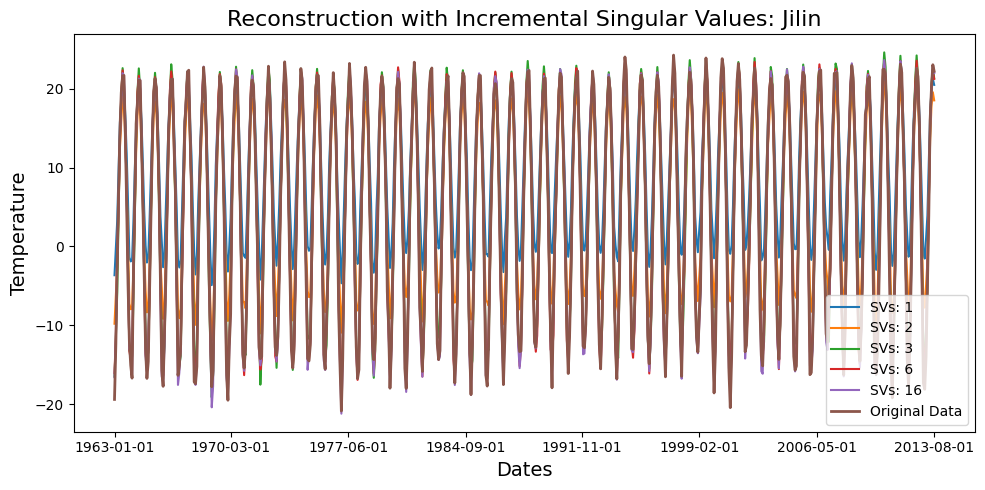

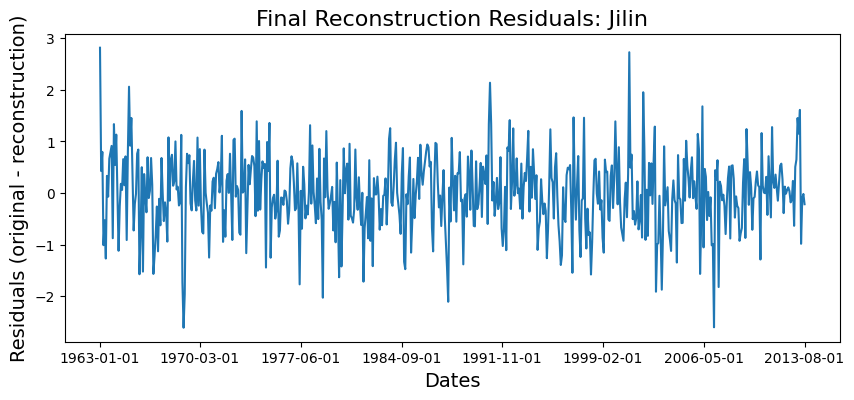

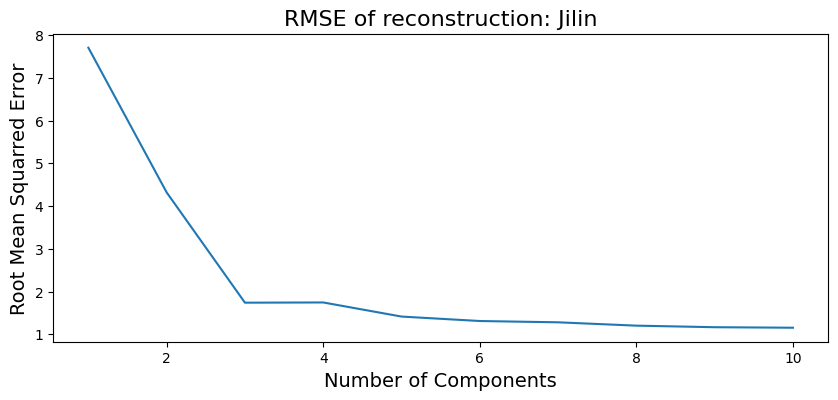

Final RMSE for PCA (Jilin): 1.1542389621966553
Final RMSE for SVD (Jilin): 1.1542389621966553


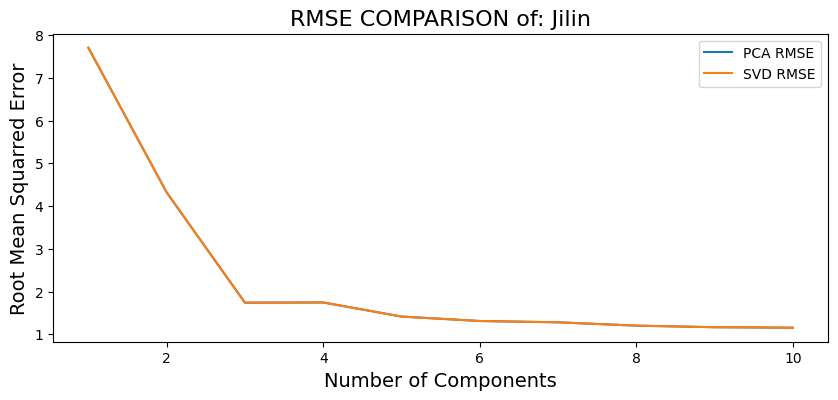

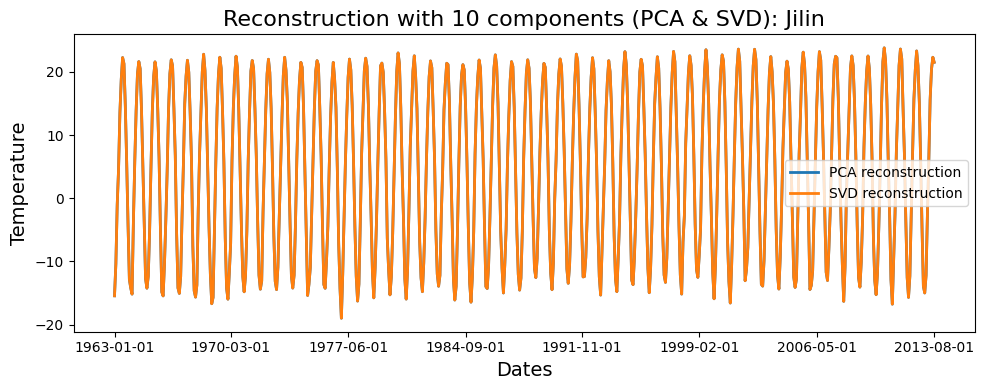

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


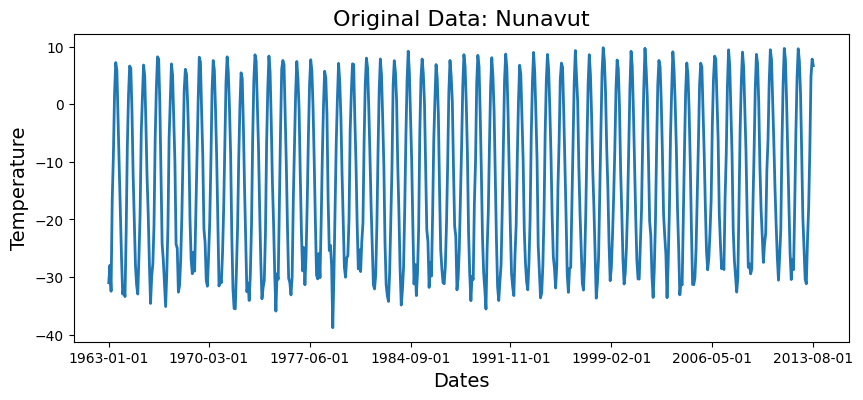

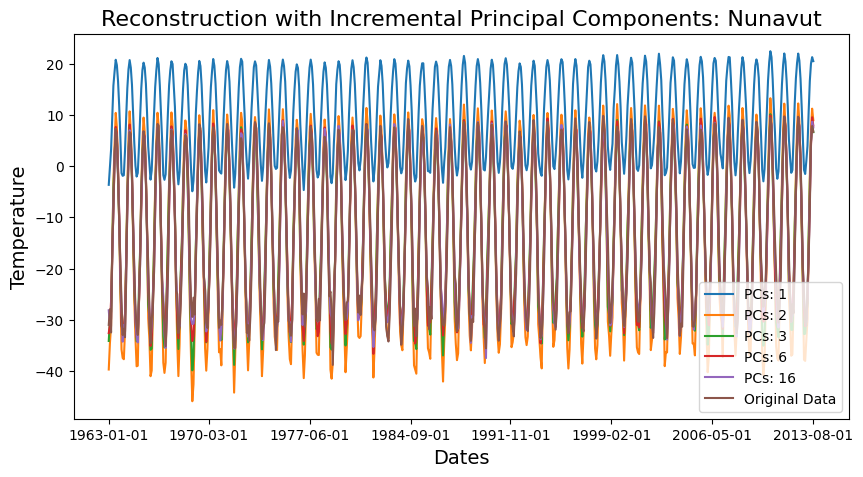

<Figure size 640x480 with 0 Axes>

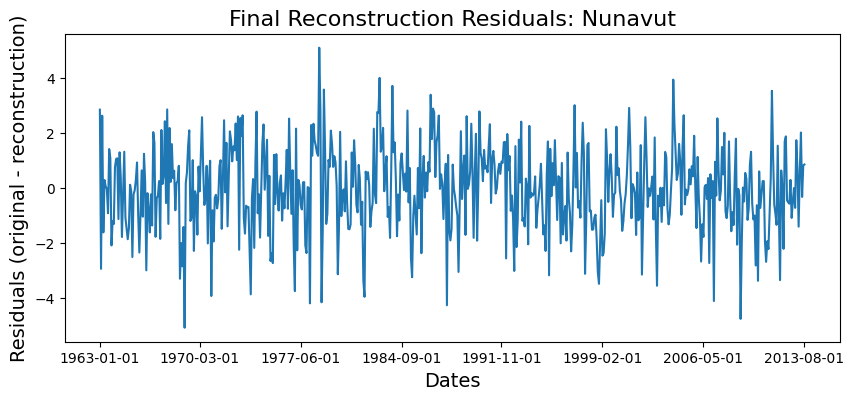

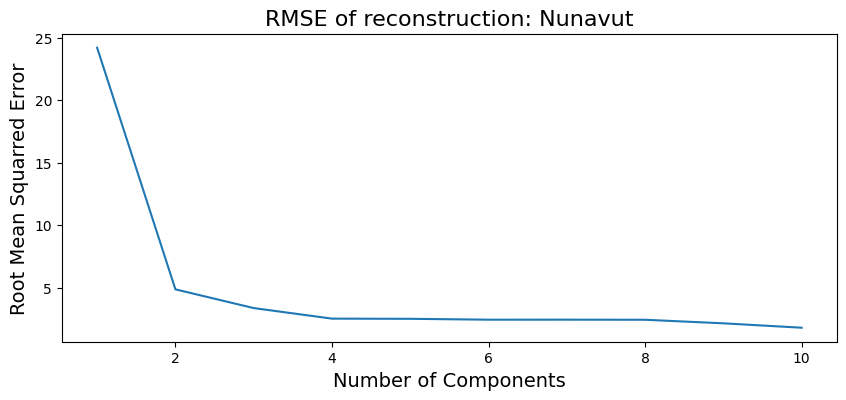

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


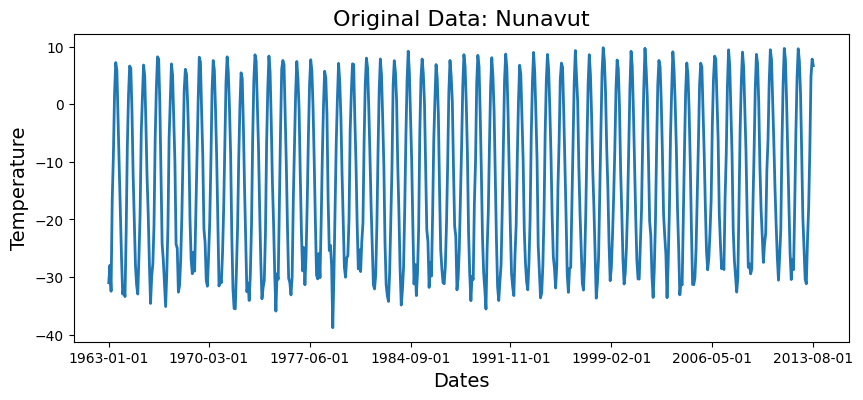

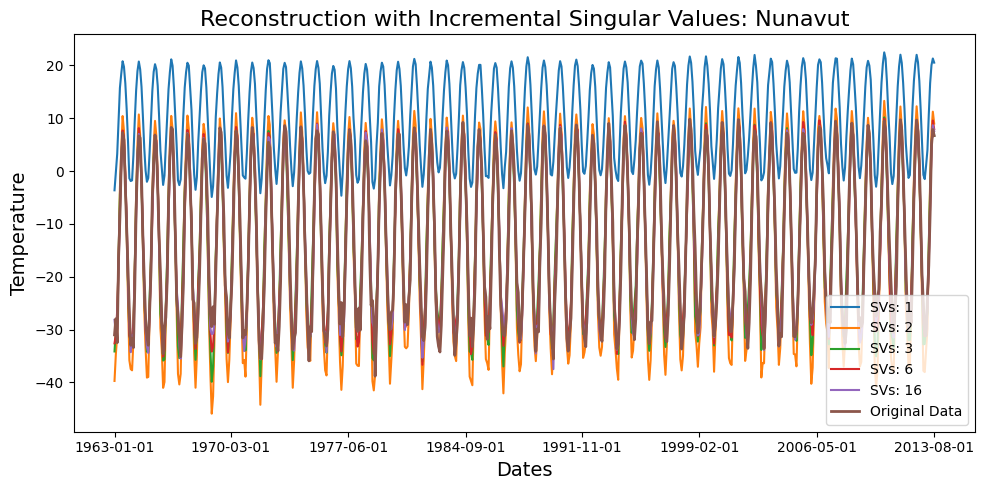

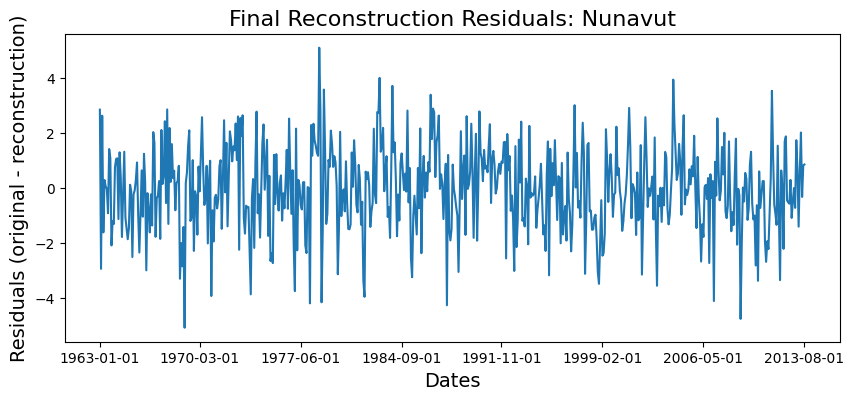

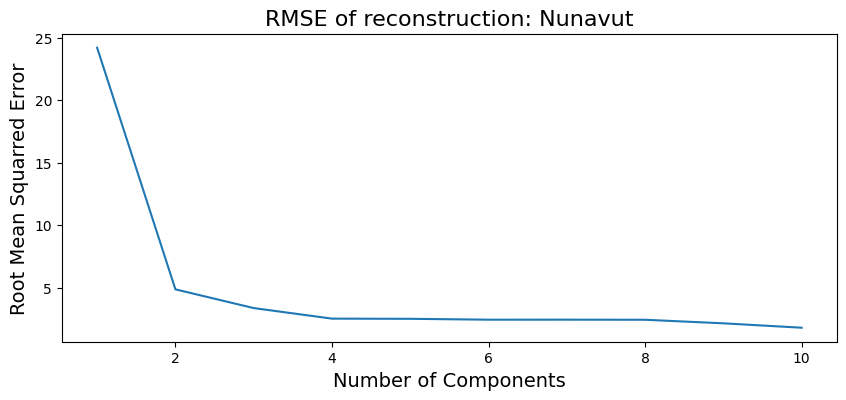

Final RMSE for PCA (Nunavut): 1.7894289375559254
Final RMSE for SVD (Nunavut): 1.789428937555928


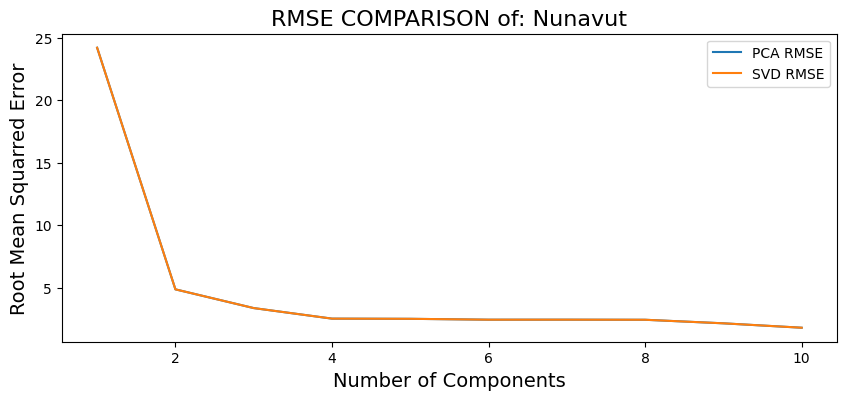

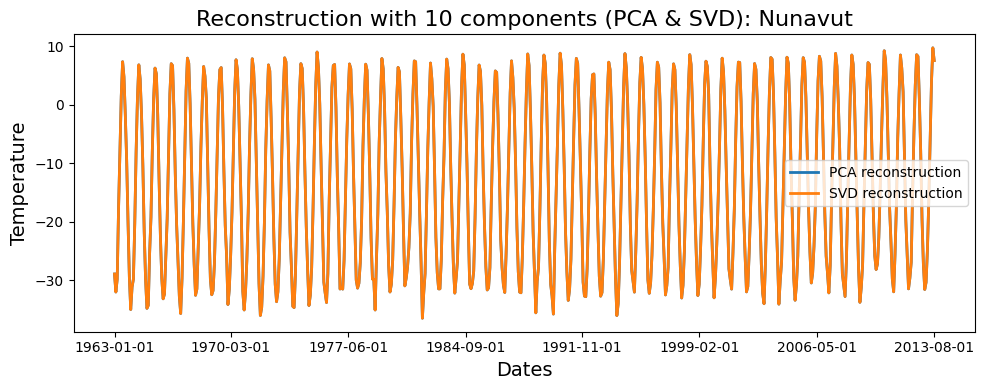

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


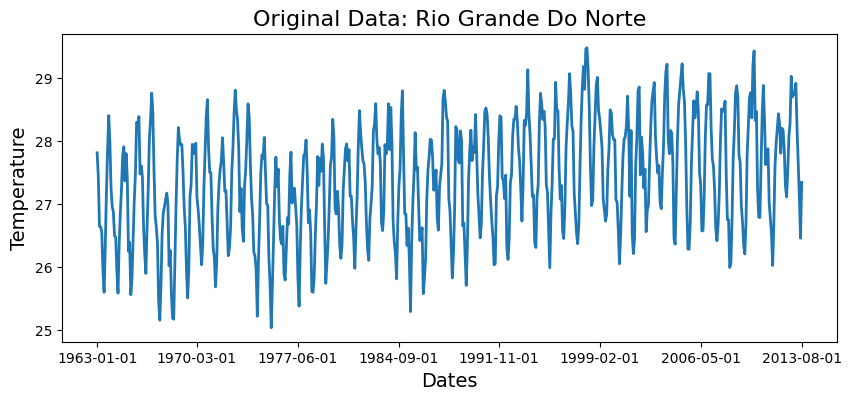

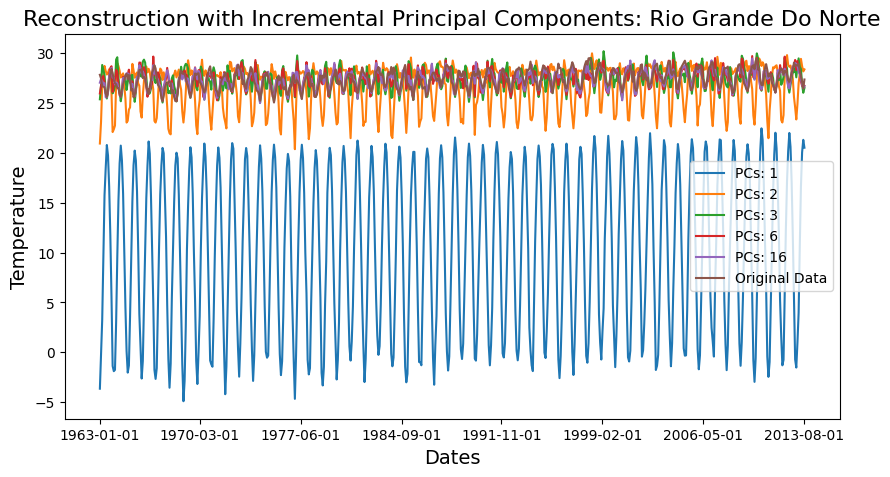

<Figure size 640x480 with 0 Axes>

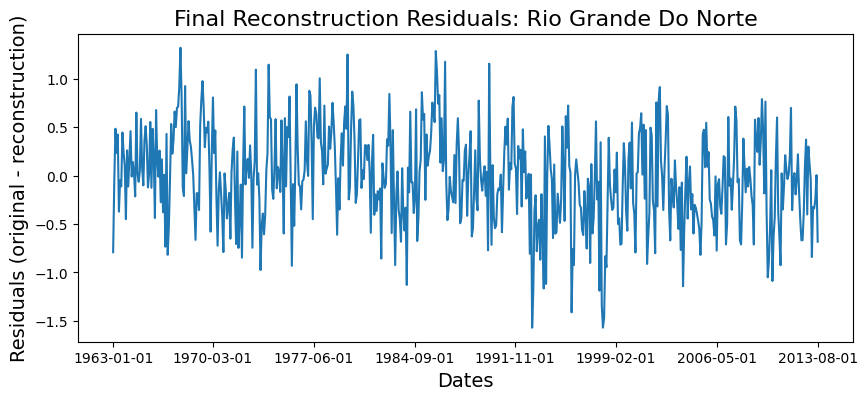

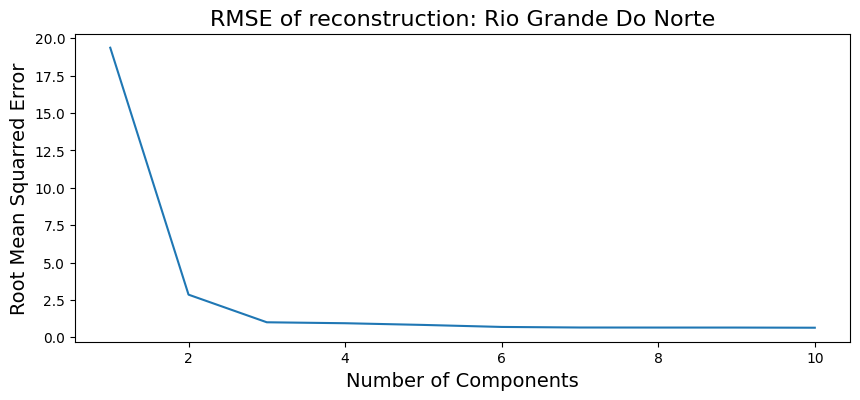

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


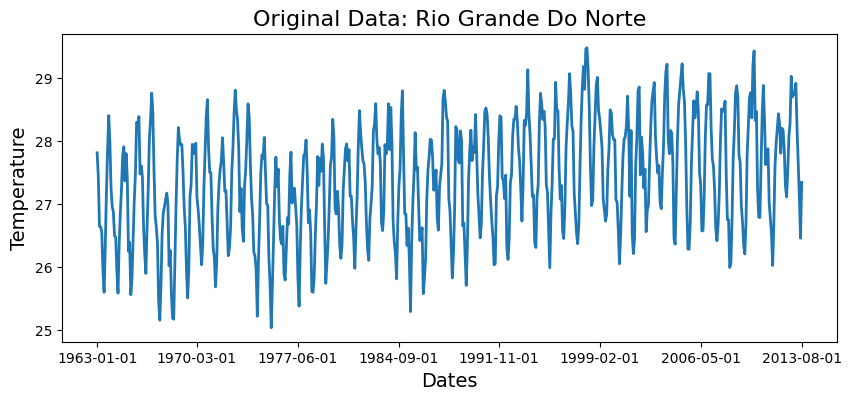

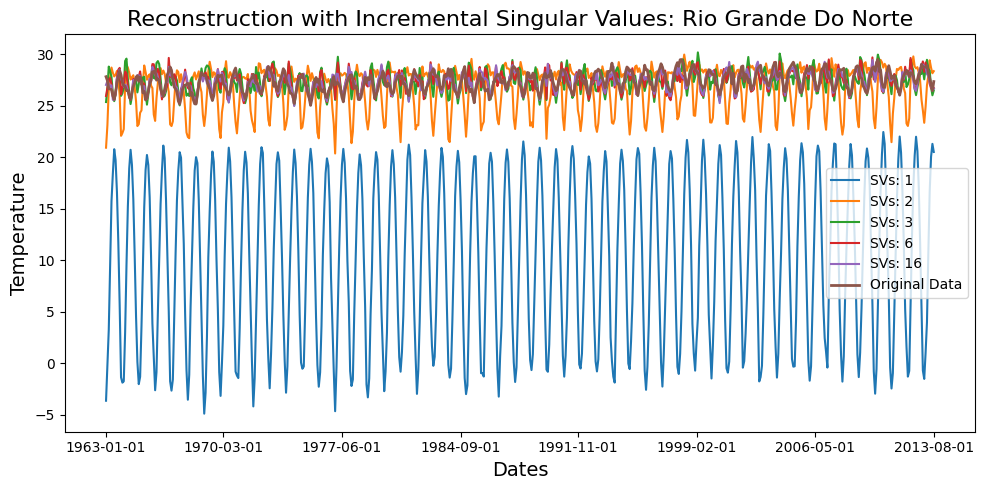

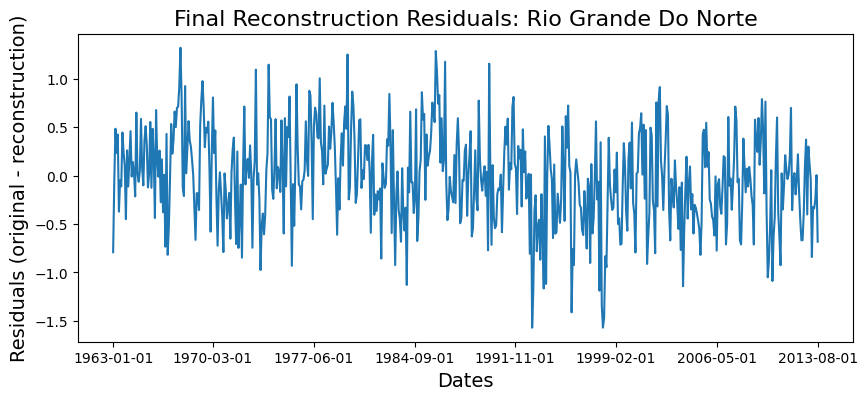

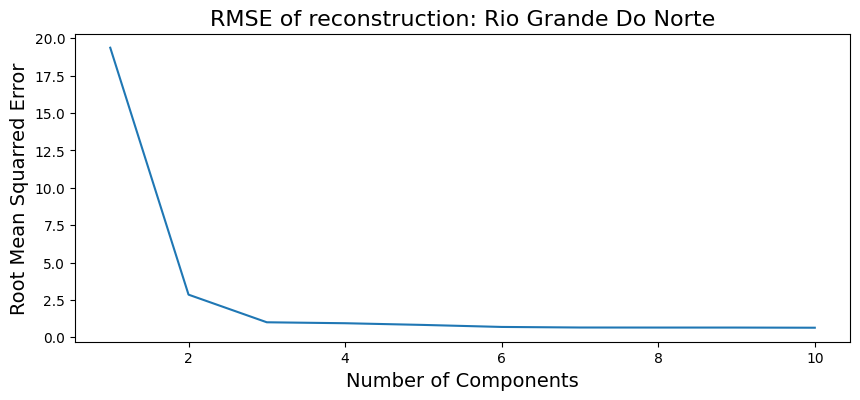

Final RMSE for PCA (Rio Grande Do Norte): 0.6461870611474395
Final RMSE for SVD (Rio Grande Do Norte): 0.6461870611474377


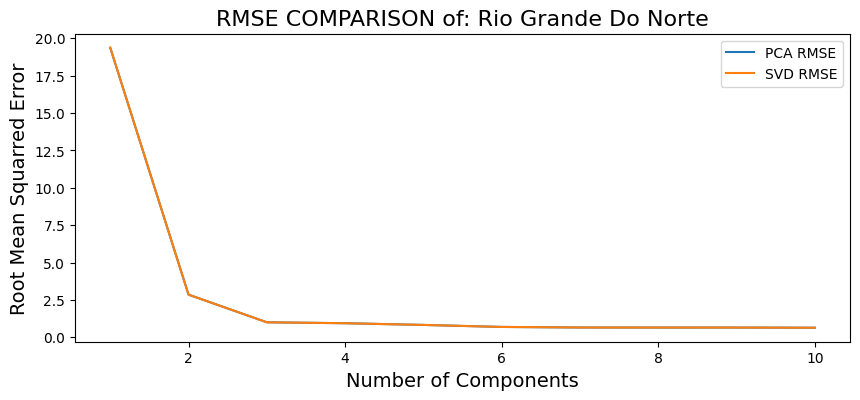

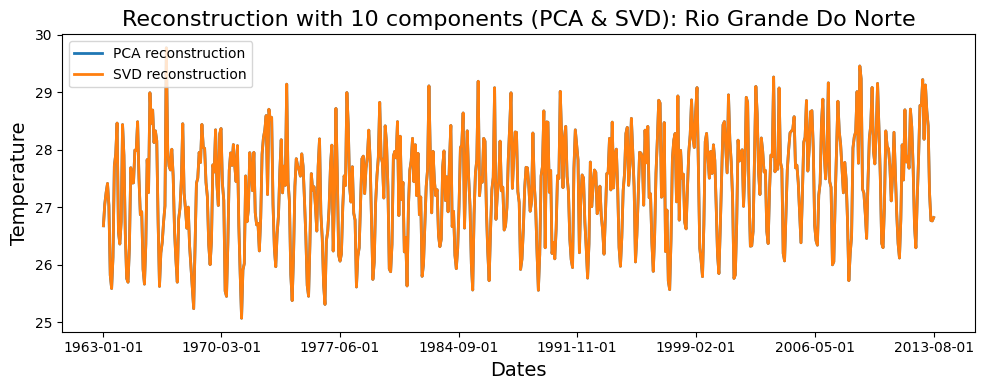

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


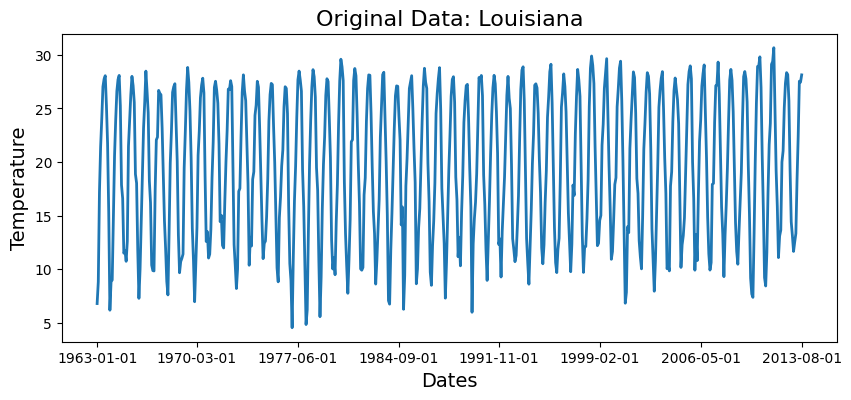

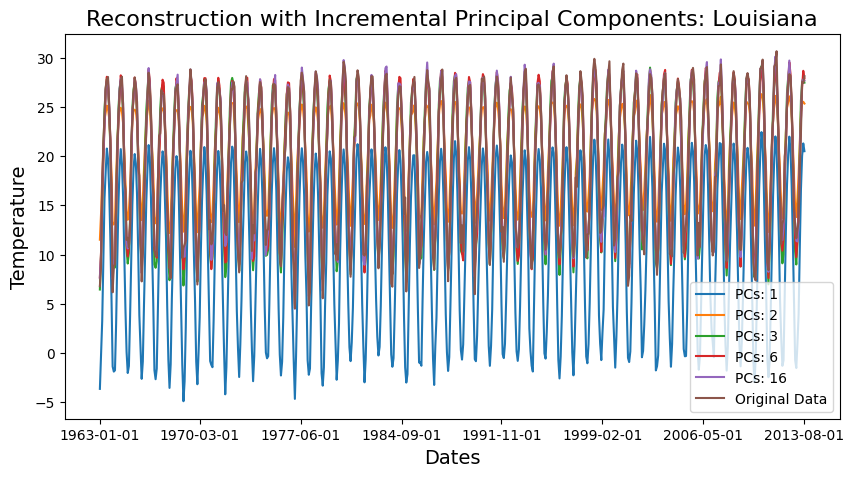

<Figure size 640x480 with 0 Axes>

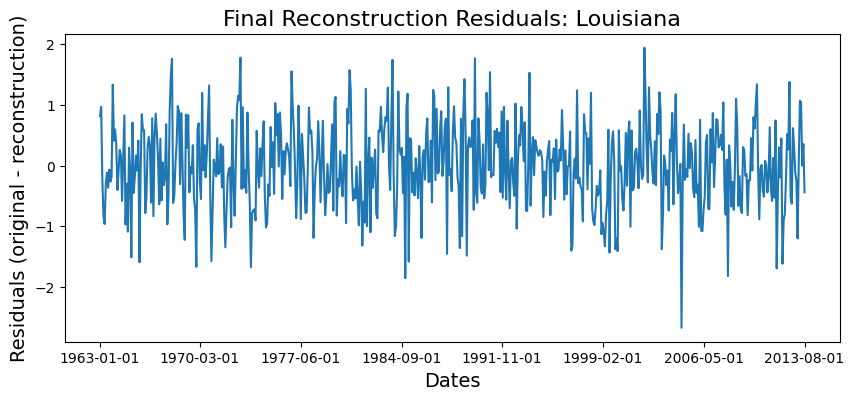

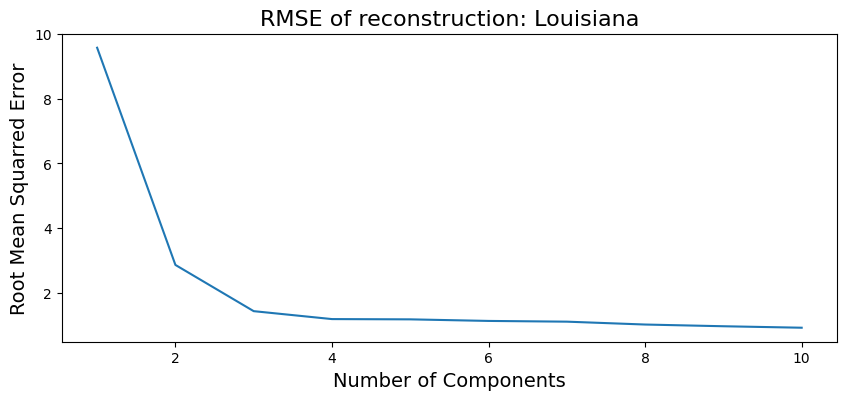

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


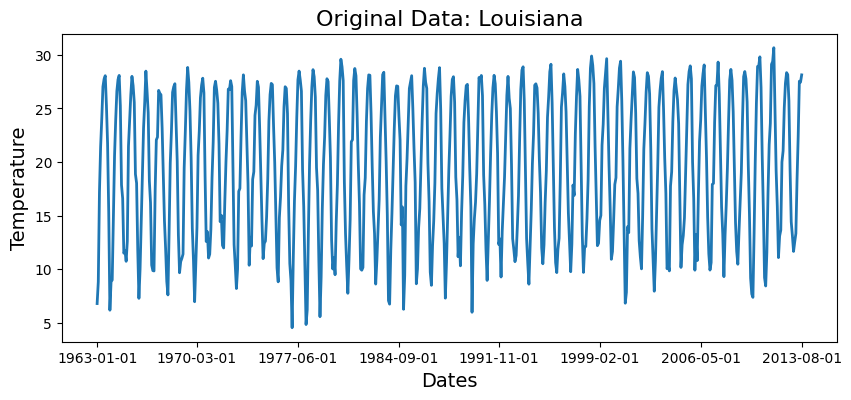

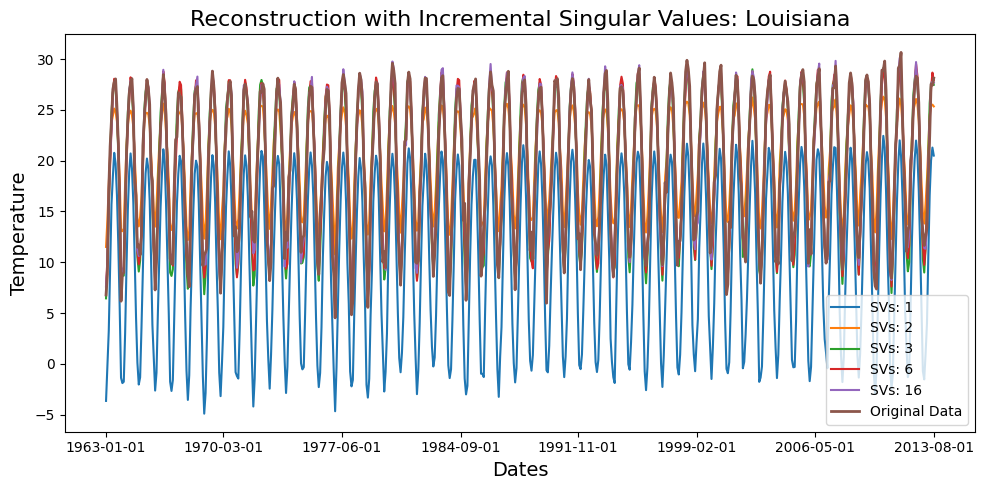

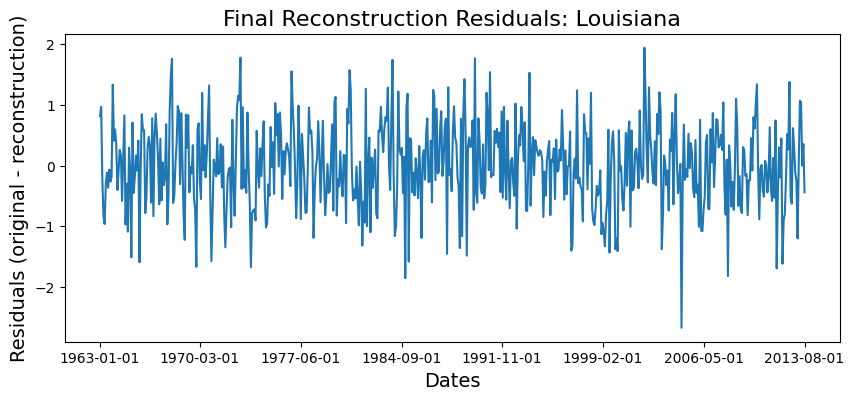

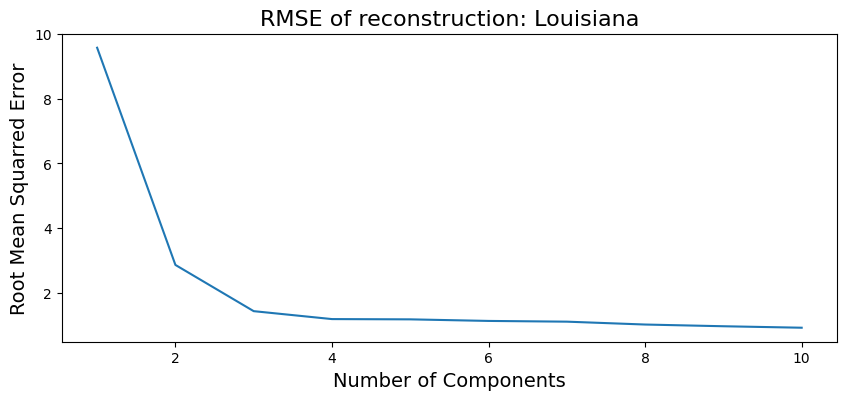

Final RMSE for PCA (Louisiana): 0.9292703648377664
Final RMSE for SVD (Louisiana): 0.9292703648377634


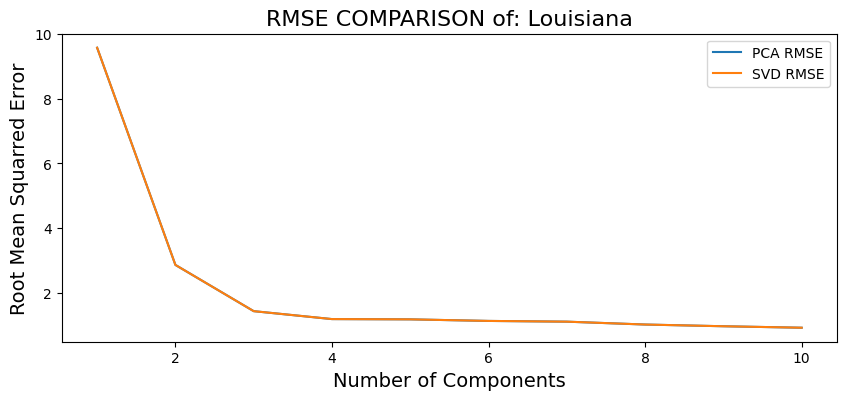

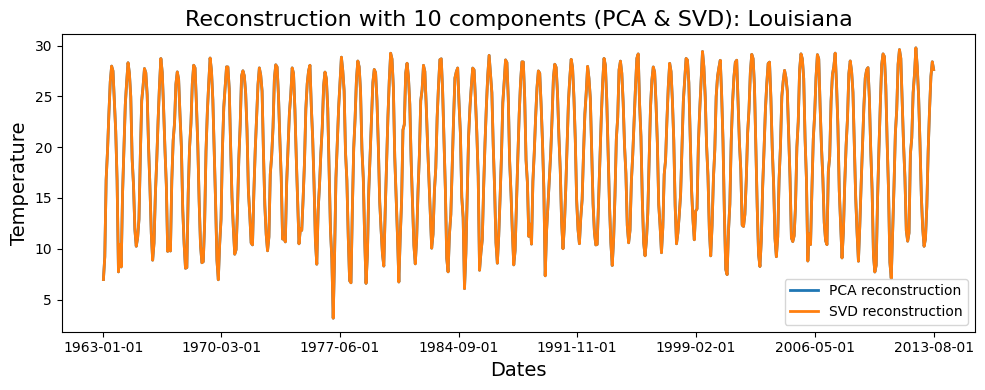

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


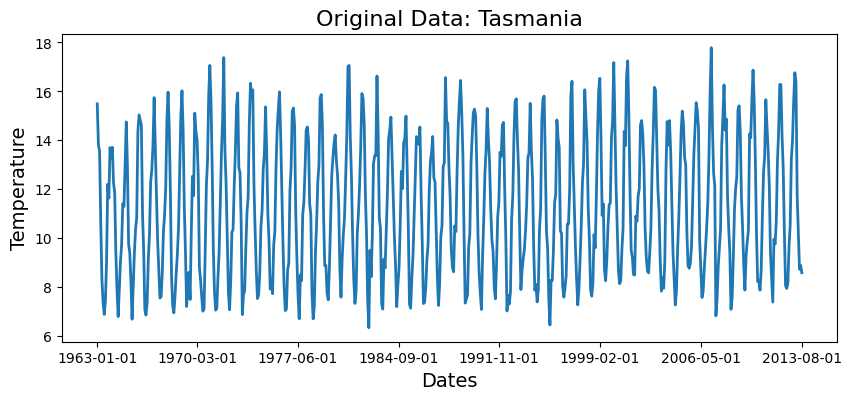

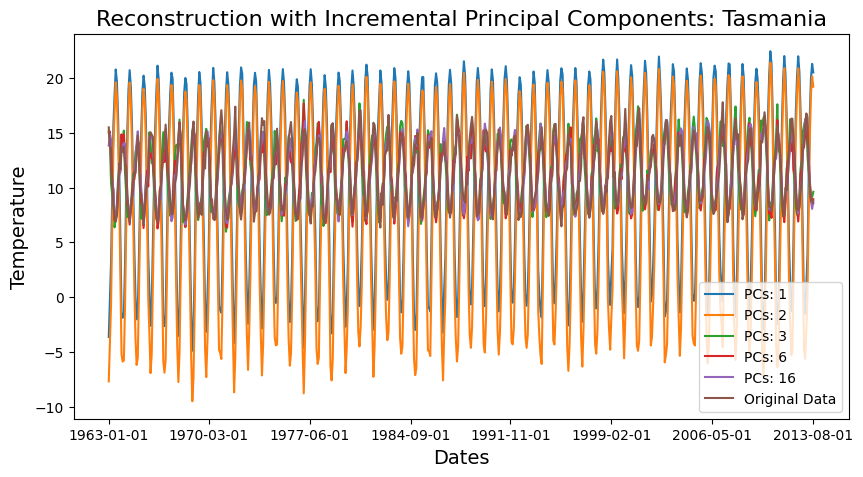

<Figure size 640x480 with 0 Axes>

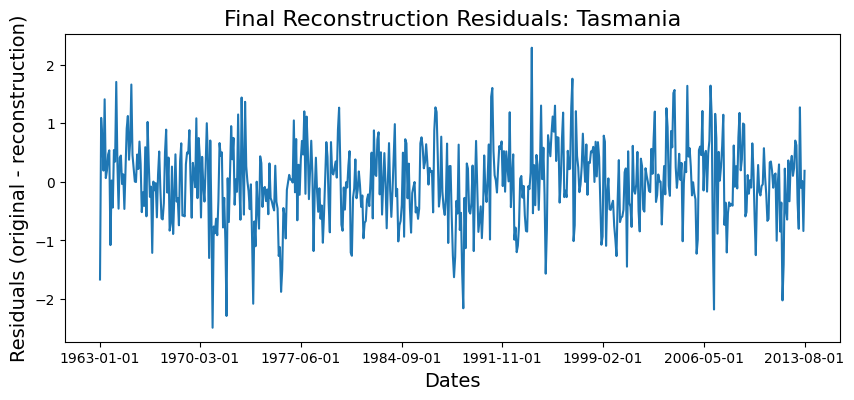

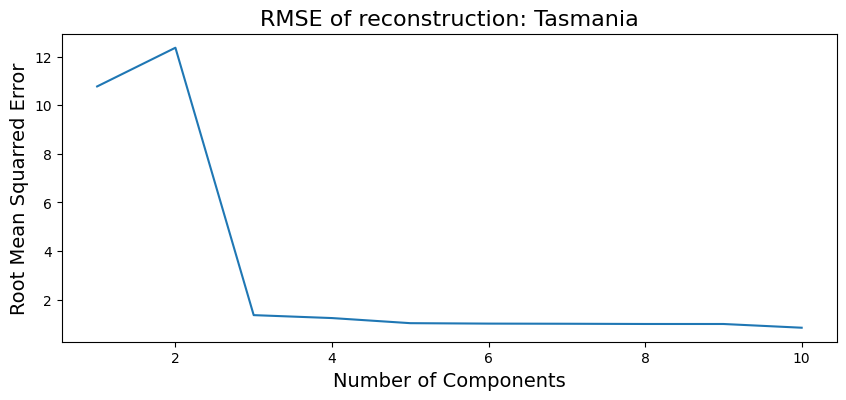

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


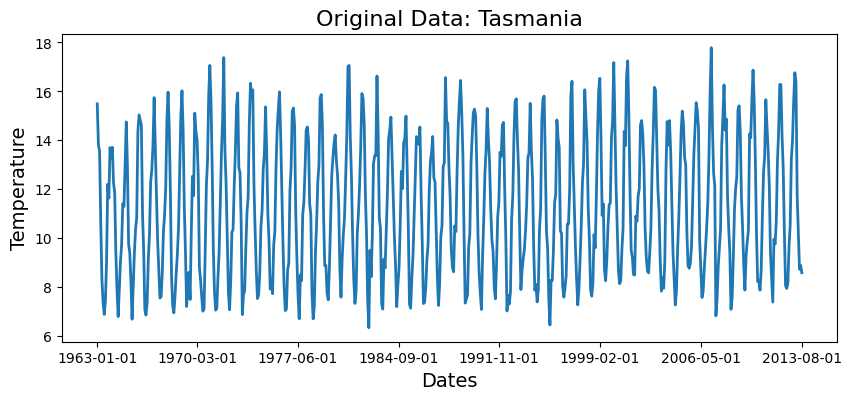

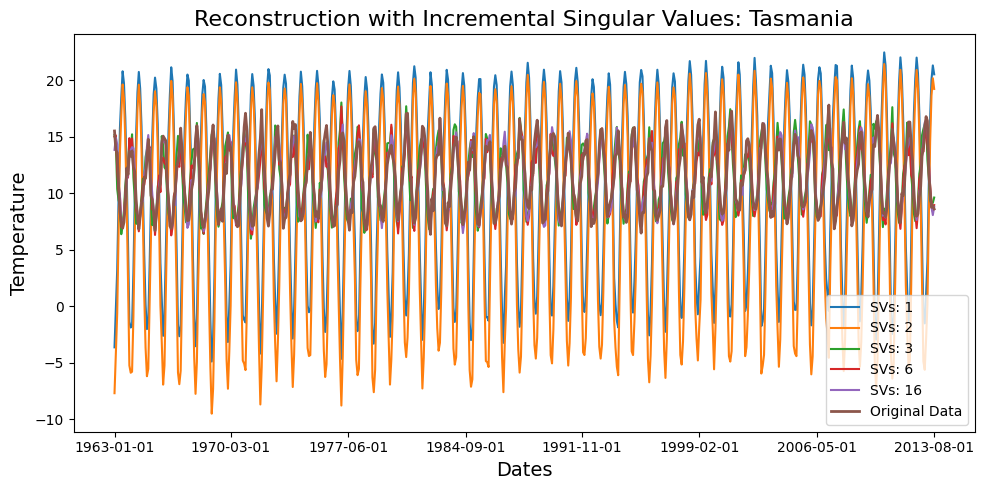

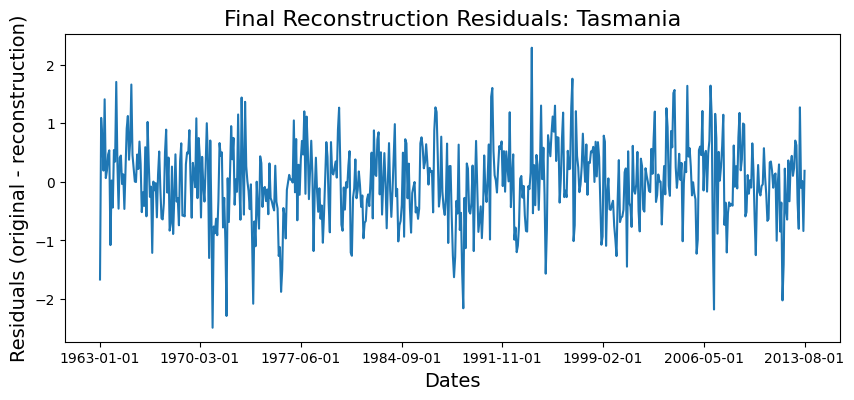

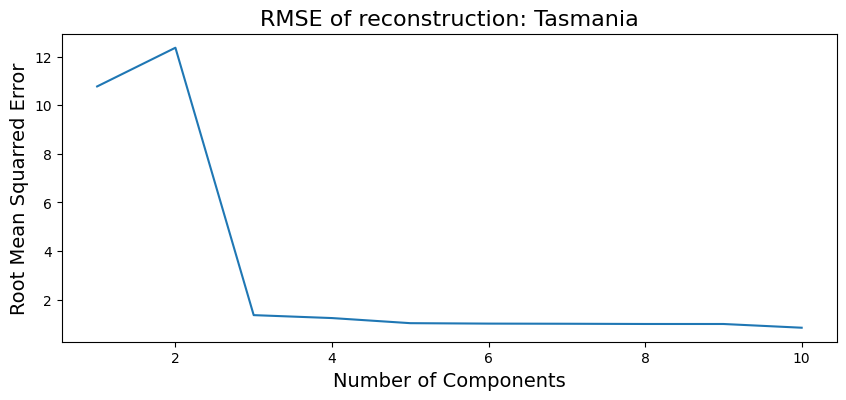

Final RMSE for PCA (Tasmania): 0.8447798000370035
Final RMSE for SVD (Tasmania): 0.8447798000370038


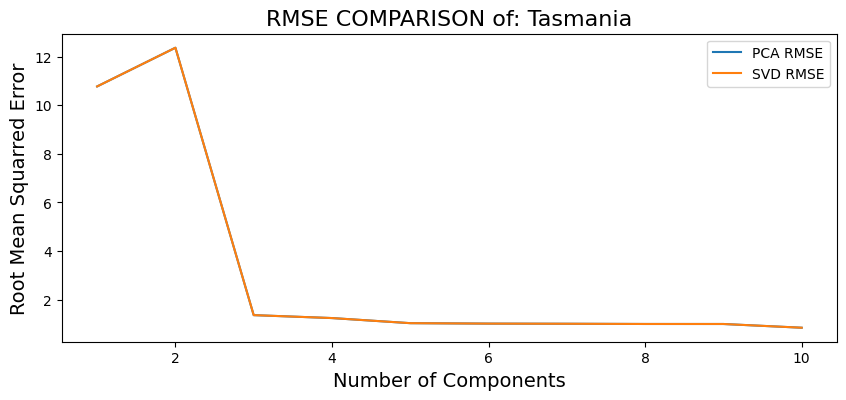

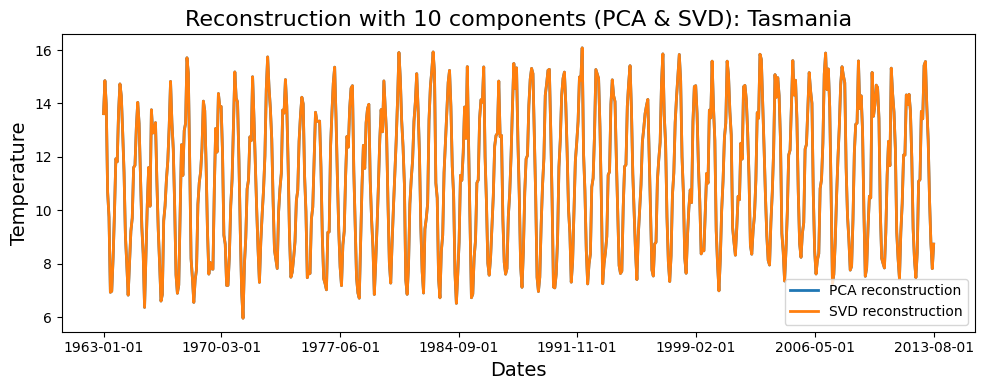

In [56]:
states = ['Jilin', 'Nunavut', 'Rio Grande Do Norte', 'Louisiana', 'Tasmania']
for state in states:
  compare_pca_svd_rmse(reformatted_state_data, state)

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Temperature Data:

1. https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data

2. https://berkeleyearth.org/data/

